In [77]:
from pathlib import Path

import pandas as pd

In [78]:
import json
import os
from concurrent.futures import ThreadPoolExecutor
from pathlib import Path

import boto3
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from archetypal import settings
from ladybug.epw import EPW
from lightning.pytorch import Trainer
from ml.predict import predict_ubem
from ml.surrogate import Surrogate
from tqdm.notebook import tqdm
from utils.constants import JOULES_TO_KWH
from weather.weather import extract

if os.name == "nt":
    settings.ep_version == "22.2.0"
    settings.energyplus_location = Path("C:/EnergyPlusV22-2-0")
else:
    settings.ep_version == "22.2.0"
    settings.energyplus_location = Path("/usr/local/EnergyPlus-22-2-0")

from archetypal.idfclass import IDF

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package energy-pandas is out of date. Your version is 0.3.3, the latest is 0.3.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [80]:
bucket = "ml-for-bem"
s3 = boto3.client("s3")

local_dir = Path("data") / "temp"
experiment_type = "validation"
version = "v5"
city = "fairbanks"
experiment_name = f"{experiment_type}/{version}/{city}"
should_gather_idf = False

registry = "ml-for-building-energy-modeling/model-registry"
model = "Global UBEM Shoebox Surrogate with Combined TS Embedder"
tag = "v3"
resource = "model.ckpt"

In [81]:
# list objects in bucket using paginator
def get_files_in_experiment(experiment):
    print("Listing files for experiment: ", experiment, "...")
    files = []
    paginator = s3.get_paginator("list_objects_v2")
    for page in paginator.paginate(Bucket=bucket, Prefix=experiment):
        if page.get("Contents"):
            for obj in page["Contents"]:
                files.append(obj["Key"])
    return files


def download(file):
    filepath = local_dir / file
    os.makedirs(filepath.parent, exist_ok=True)
    s3.download_file(bucket, file, filepath)
    return filepath


def download_and_open_json(file):
    filepath = download(file)
    with open(filepath, "r") as f:
        return json.load(f)


def download_and_open_hdf(file):
    filepath = download(file)
    return pd.read_hdf(filepath)


def get_weather():
    weather_folder = (Path(experiment_name).parent / "epw").as_posix()
    # list files in weather folder
    weather_files = get_files_in_experiment(weather_folder)
    with ThreadPoolExecutor(max_workers=8) as executor:
        weather_files = list(
            tqdm(executor.map(download, weather_files), total=len(weather_files))
        )
    return weather_files


def download_and_open_ground_truth():
    file = experiment_name + "/Buildings.hdf"
    true_df = download_and_open_hdf(file)

    true_df = true_df.sort_index(level="file_name")
    building_id = (
        true_df.index.to_frame()["file_name"].str.split(".").str[0].astype(int)
    )
    building_id.name = "building_id"
    true_df = true_df.set_index(building_id, append=True).sort_index(
        level="building_id"
    )

    true_df = true_df * JOULES_TO_KWH
    return true_df

In [82]:
surrogate = Surrogate.load_from_registry(registry, model, tag, resource)
surrogate.model.eval()
torch.set_float32_matmul_precision("medium")

trainer = Trainer(
    accelerator="auto",
    devices="auto",
    strategy="auto",
    enable_progress_bar=True,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


## Facade Analysis

See corresponding grasshopper file for .csv generation

In [83]:
orientation = 0.0
config = {
    "FacadeMass": 2,
    "RoofMass": 2,
    "FacadeRValue": 2.0,
    "RoofRValue": 2.0,
    "SlabRValue": 2.0,
    "WindowUValue": 1.0,
    "WindowShgc": 0.5,
    "PeopleDensity": 0.05,
    "EquipmentPowerDensity": 12,
    "LightingPowerDensity": 12,
    "HeatingSetpoint": 21,
    "CoolingSetpoint": 25,
    "cop_heating": 1,
    "cop_cooling": 1,
    "VentilationMode": 1,  # vent_mode, 2
    "VentilationPerArea": 0.0005,
    "VentilationPerPerson": 0.0025,
    "EconomizerSettings": 0,
    "RecoverySettings": 0,
    "Infiltration": 0.0005,
    "wwr": 0.2,
    "roof_2_footprint": 0.0,
    "ground_2_footprint": 0.0,
    "orientation": orientation,
    "width": 4,
    "height": 3,
    "perim_depth": 3,
    "core_depth": 10,
    "weight": 1,
    "template_idx": 0,
    # "floor_name": "none",
}
# for i in range(12):
#     config[f"shading_{i}"] = 0

epw = EPW(
    "C:/ProgramData/Solemma/Common/WeatherData/EPW/USA_MA_Boston-Logan.Intl.AP.725090_TMYx.2004-2018.epw"
)
climate = extract(epw)
schedules = pd.read_hdf("data/schedules.h5")
scheds = schedules.xs("RefBldgMediumOffice", level=0).values.reshape(1, 3, 8760)
pfeatures = pd.DataFrame(data=[config])
files = list(Path("C:/users/szvsw/desktop/facade-angles/").glob("*.csv"))
dfs = [pd.read_csv(f) for f in files]
# dfs = [pd.Series(pd.read_csv(f).columns).astype(float) for f in files]
# pd.concat(dfs, axis=1, keys=[f.stem for f in files])
shading_df = pd.concat(dfs, keys=[int(f.stem) for f in files]).sort_index()
shading_df.index = pd.Series(range(len(shading_df)), name="building_id")
shading_df = (
    shading_df.set_index(
        pd.Series(shading_df.index.values // 10, name="floor"), append=True
    )
    .set_index(pd.Series(shading_df.index % 10, name="room"), append=True)
    .sort_index()
)
shading_df
for col in pfeatures.columns:
    shading_df[col] = pfeatures[col].values[0]
ix = shading_df.index
shading_df = shading_df.reset_index("building_id").reset_index(drop=True)
shading_df

,building_id,shading_0,shading_1,shading_2,shading_3,shading_4,shading_5,shading_6,shading_7,shading_8,...,wwr,roof_2_footprint,ground_2_footprint,orientation,width,height,perim_depth,core_depth,weight,template_idx
0,0,0.230316,0.690595,0.697546,0.811769,0.887226,1.041049,1.041049,1.009755,0.939052,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0
1,1,0.230316,0.690595,0.680146,0.811769,0.887226,1.041049,1.041049,1.009755,0.362491,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0
2,2,0.230316,0.484898,0.680146,0.811769,1.009755,1.041049,1.041049,1.009755,0.362491,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0
3,3,0.245622,0.484898,0.680146,0.811769,1.009755,1.041049,1.041049,0.415885,0.362491,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0
4,4,0.245622,0.484898,0.680146,0.939052,1.009755,1.041049,1.041049,0.415885,0.362491,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,195,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0
196,196,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0
197,197,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0
198,198,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.2,0.0,0.0,0.0,4,3,3,10,1,0


In [84]:
shoebox_results, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=shading_df,
    schedules=scheds,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
(
    shoebox_results["Perimeter"].T.groupby("Name").sum().T * 3 / 13
    + shoebox_results["Core"].T.groupby("Name").sum().T * 10 / 13
)
# annual_results
res = shoebox_results["Perimeter"].T.groupby("Name").sum().T
# res = annual_results
res.index = ix
res.reset_index().to_csv("c:/users/szvsw/facade-energy.csv", index=False)
# k = res.Cooling

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 50.46it/s]


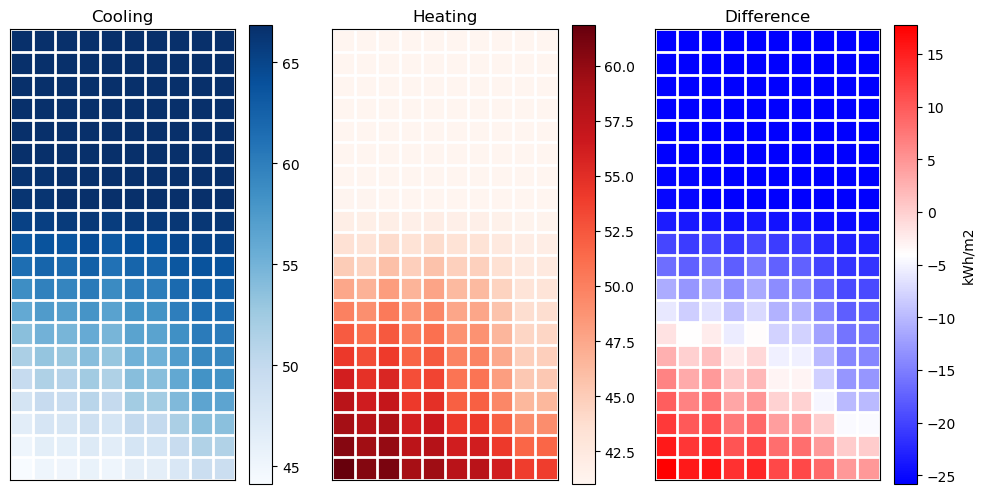

In [85]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(10, 5))
square = res.droplevel(level="building_id").unstack(level="room")
im = ax[0].imshow(square.Cooling, cmap="Blues")
fig.colorbar(im, ax=ax[0])
ax[0].set_title("Cooling")
ax[0].invert_yaxis()  # Reverse y-axis orientation
im = ax[1].imshow(square.Heating, cmap="Reds")
fig.colorbar(im, ax=ax[1])
ax[1].set_title("Heating")
ax[1].invert_yaxis()  # Reverse y-axis orientation
im = ax[2].imshow(-(square.Cooling.values - square.Heating.values), cmap="bwr")
fig.colorbar(im, ax=ax[2], label="kWh/m2")
ax[2].set_title("Difference")
ax[2].invert_yaxis()  # Reverse y-axis orientation
# add grid lines to each axis every one units
for a in ax:
    a.set_xticks(np.arange(square.Heating.shape[1] + 1) - 0.5, minor=True)
    a.set_yticks(np.arange(square.Heating.shape[0] + 1) - 0.5, minor=True)
    a.grid(which="minor", color="w", linestyle="-", linewidth=2)
    a.tick_params(which="minor", bottom=False, left=False)
    a.set_xticks([])
    a.set_yticks([])
plt.tight_layout()

## Parametric Sweeps

In [86]:
sweeps = shading_df.copy(deep=True)
for col in sweeps.columns:
    if col.startswith("shading"):
        sweeps[col] = 0
sweeps = sweeps.iloc[0:1]
sweep_ix = pd.MultiIndex.from_product(
    [np.linspace(0, 2 * np.pi, 256), np.linspace(0.2, 0.8, 256)],
    names=["orientation", "wwr"],
)

sweepdf = sweeps.reindex(sweep_ix).drop(columns=["orientation", "wwr"])
for col in sweeps.columns:
    if col.startswith("shading"):
        sweepdf[col] = 0.0
    elif col not in sweepdf.index.names:
        sweepdf[col] = sweeps[col].values[0]
    else:
        pass
sweepdf = sweepdf.reset_index()
sweepdf["building_id"] = range(len(sweepdf))
shoebox_results, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=sweepdf,
    schedules=scheds,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
# annual_results
res = shoebox_results["Perimeter"].T.groupby("Name").sum().T
res_a = annual_results
res.index = sweep_ix
res_a.index = sweep_ix

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 2048/2048 [00:44<00:00, 46.20it/s]


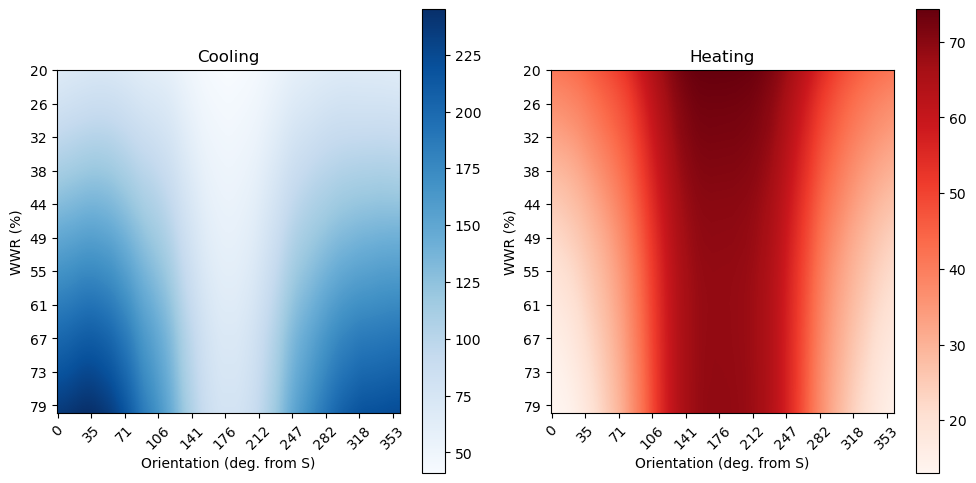

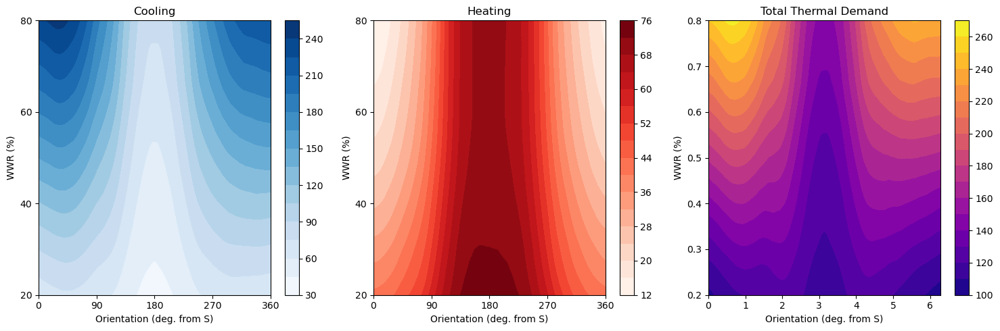

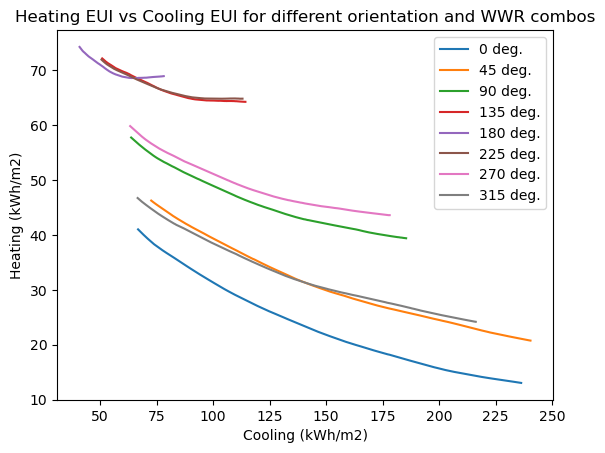

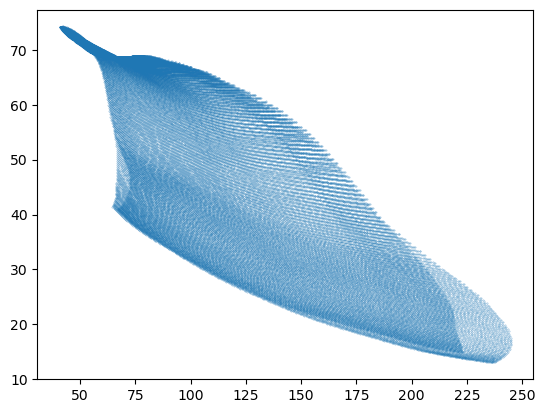

In [88]:
data = res.unstack(level="wwr")
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
im = ax[0].imshow(data.Cooling.values.T, cmap="Blues")
n = 25
x_tick_labels = [round(x * 360 / (2 * np.pi)) for x in data.index.values][::n]
y_tick_labels = [round(y * 100) for y in data.Cooling.columns.get_level_values(-1)][::n]
ax[0].set_yticks(range(0, 256, 25), y_tick_labels)
ax[0].set_xticks(range(0, 256, 25), x_tick_labels, rotation=45)
ax[0].set_xlabel("Orientation (deg. from S)")
ax[0].set_ylabel("WWR (%)")
ax[0].set_title("Cooling")
fig.colorbar(im, ax=ax[0])
im = ax[1].imshow(data.Heating.values.T, cmap="Reds")
n = 25
x_tick_labels = [round(x * 360 / (2 * np.pi)) for x in data.index.values][::n]
y_tick_labels = [round(y * 100) for y in data.Cooling.columns.get_level_values(-1)][::n]
ax[1].set_yticks(range(0, 256, 25), y_tick_labels)
ax[1].set_xticks(range(0, 256, 25), x_tick_labels, rotation=45)
ax[1].set_xlabel("Orientation (deg. from S)")
ax[1].set_ylabel("WWR (%)")
ax[1].set_title("Heating")
# add contour plot
fig.colorbar(im, ax=ax[1])
fig.tight_layout()
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
levels = 15
im = ax[0].contourf(
    data.index,
    data.Cooling.columns,
    data.Cooling.values.T,
    levels=levels,
    cmap="Blues",
)
ax[0].set_xticks(
    [0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi],
    ["0", "90", "180", "270", "360"],
)
ax[0].set_yticks([0.2, 0.4, 0.6, 0.8], ["20", "40", "60", "80"])
ax[0].set_xlabel("Orientation (deg. from S)")
ax[0].set_ylabel("WWR (%)")
ax[0].set_title("Cooling")
im2 = ax[1].contourf(
    data.index,
    data.Cooling.columns,
    data.Heating.values.T,
    levels=levels,
    cmap="Reds",
)
ax[1].set_xticks(
    [0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi],
    ["0", "90", "180", "270", "360"],
)
ax[1].set_yticks([0.2, 0.4, 0.6, 0.8], ["20", "40", "60", "80"])
ax[1].set_xlabel("Orientation (deg. from S)")
ax[1].set_ylabel("WWR (%)")
ax[1].set_title("Heating")
fig.colorbar(im2, ax=ax[1])
fig.colorbar(im, ax=ax[0])
im = ax[2].contourf(
    data.index,
    data.Cooling.columns,
    data.Cooling.values.T + data.Heating.values.T,
    levels=levels,
    cmap="plasma",
)
ax[2].set_xlabel("Orientation (deg. from S)")
ax[2].set_ylabel("WWR (%)")
ax[2].set_title("Total Thermal Demand")
fig.colorbar(im, ax=ax[2])

fig.tight_layout()

plt.figure()

n = 8
for i in range(n):
    plt.plot(
        data.iloc[i * (len(data) // n) : i * (len(data) // n) + 1]
        .stack(level=-1)
        .Cooling,
        data.iloc[i * (len(data)) // n : i * (len(data) // n) + 1]
        .stack(level=-1)
        .Heating,
        # s=1.0,
        label=f"{round(i*360//n)} deg.",
        # alpha=0.5,
    )
plt.xlabel("Cooling (kWh/m2)")
plt.ylabel("Heating (kWh/m2)")
plt.title("Heating EUI vs Cooling EUI for different orientation and WWR combos")
plt.legend()

plt.figure()
plt.scatter(
    data.stack(level=-1).Cooling,
    data.stack(level=-1).Heating,
    s=0.1,
    alpha=0.5,
)

In [89]:
sweeps = shading_df.copy(deep=True)
for col in sweeps.columns:
    if col.startswith("shading"):
        sweeps[col] = 0
sweeps = sweeps.iloc[0:1]
sweep_ix = pd.MultiIndex.from_product(
    [np.linspace(0, 2 * np.pi, 256), np.linspace(0.2, 0.8, 256)],
    names=["orientation", "wwr"],
)

sweepdf = sweeps.reindex(sweep_ix).drop(columns=["orientation", "wwr"])
for col in sweeps.columns:
    if col.startswith("shading"):
        sweepdf[col] = 0.0
    elif col not in sweepdf.index.names:
        sweepdf[col] = sweeps[col].values[0]
    else:
        pass
sweepdf = sweepdf.reset_index()
sweepdf["building_id"] = range(len(sweepdf))
sweepdf["EquipmentPowerDensity"] = np.random.uniform(0, 20, len(sweepdf))
sweepdf["LightingPowerDensity"] = np.random.uniform(0, 20, len(sweepdf))
sweepdf["PeopleDensity"] = np.random.uniform(0, 0.1, len(sweepdf))
sweepdf["VentilationPerArea"] = np.random.uniform(0, 0.001, len(sweepdf))
sweepdf["VentilationPerPerson"] = np.random.uniform(0, 0.01, len(sweepdf))
sweepdf["Infiltration"] = np.random.uniform(0, 0.001, len(sweepdf))
shoebox_results, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=sweepdf,
    schedules=scheds,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
# annual_results
res = shoebox_results["Perimeter"].T.groupby("Name").sum().T
res_a = annual_results
res.index = sweep_ix
res_a.index = sweep_ix

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 2048/2048 [00:44<00:00, 46.37it/s]


([], [])

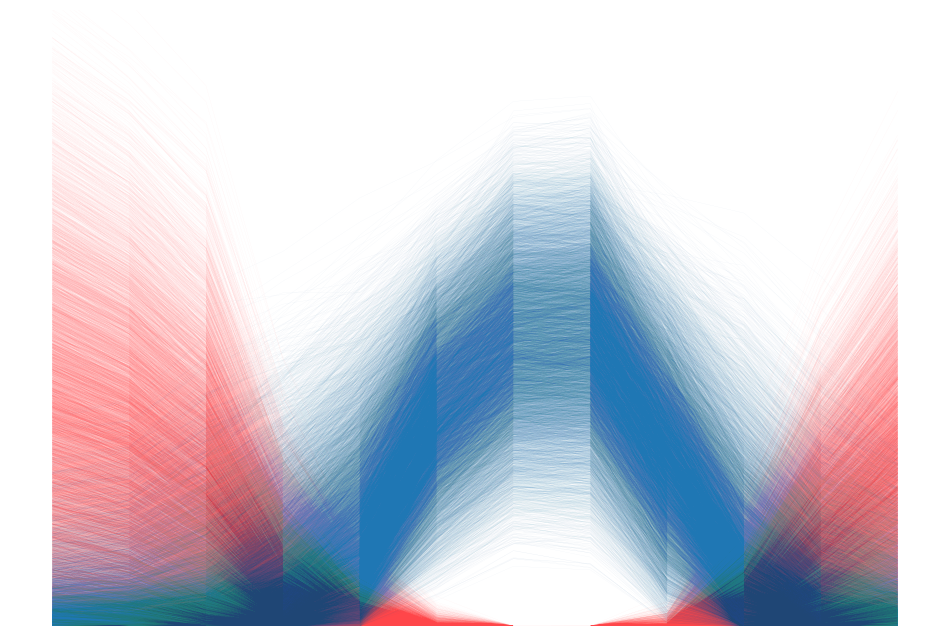

In [90]:
fig = plt.figure(figsize=(12, 8))
d = monthly_results.sample(frac=0.2)

ax = plt.plot(
    d.Heating.values.T,
    color="#ff464a",
    alpha=0.1,
    lw=0.1,
)
ax = plt.plot(
    d.Cooling.values.T * 1.25,
    color="#1f77b4",
    alpha=0.1,
    lw=0.1,
)
# hide the axes and border
plt.ylim(0, d.Heating.max().max() * 0.9)
plt.box(False)
plt.grid(False)
plt.xticks([])
plt.yticks([])

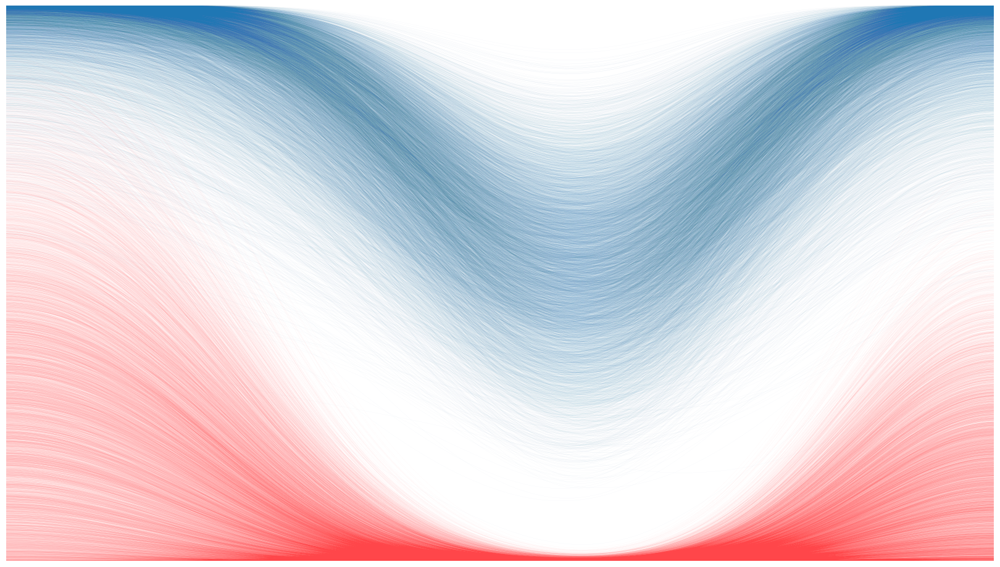

In [141]:
from scipy.ndimage import gaussian_filter1d

# interpolate the cooling values
c = []
h = []
k = monthly_results.sample(frac=0.15)
for i in range(len(k)):
    cooling = np.interp(
        np.linspace(0, 11, 144), np.arange(12), k.iloc[i].Cooling.values
    )
    heating = np.interp(
        np.linspace(0, 11, 144), np.arange(12), k.iloc[i].Heating.values
    )
    c.append(cooling)
    h.append(heating)
cooling = np.array(c)
heating = np.array(h)
# smooth the curves
cooling = gaussian_filter1d(cooling, sigma=12)
heating = gaussian_filter1d(heating, sigma=12)
# plot the smoothed curves
fig = plt.figure(figsize=(16, 9))
plt.plot(
    heating.max() * 0.9 + -1 * cooling.T * 1.25,
    color="#1f77b4",
    lw=0.1,
    alpha=0.1,
    label="Cooling",
)
ax = plt.plot(
    heating.T,
    color="#ff464a",
    lw=0.1,
    alpha=0.1,
    label="Heating",
)
# hide the axes and border
# plt.ylim(0, heating.max() * 0.9)
plt.ylim(0, heating.max() * 0.9)
plt.xlim(0, 143)
plt.box(False)
plt.grid(False)
plt.xticks([])
plt.yticks([])
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.axis("off")
# make sure background is fully white
fig.patch.set_facecolor("white")
# save the image to a file
# plt.savefig(
#     "c:/users/szvsw/desktop/cooling-heating-reverse.png",
#     dpi=300,
#     bbox_inches="tight",
#     pad_inches=0,
# )

([], [])

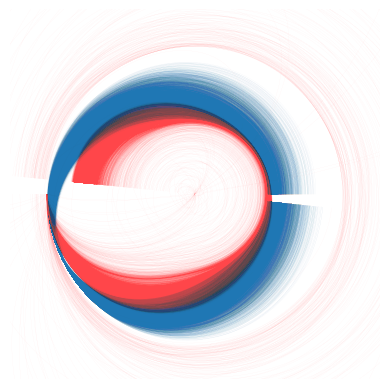

In [124]:
n_pts = cooling.shape[-1]
for i in range(cooling.shape[0]):
    d = cooling[i] / cooling[i].max()
    theta = np.linspace(0, 2 * np.pi - 0.1, n_pts)
    x = np.cos(theta)
    y = np.sin(theta)
    # displace each point by the slope a distance according to d
    plt.plot(x + x * d, y + y * d, lw=0.1, alpha=0.1, color="#1f77b4")
    d = heating[i] / heating[i].max()
    plt.plot(-(x + x * d), -(y + y * d), lw=0.1, alpha=0.1, color="#ff464a")
plt.xlim(-2.5, 2.5)
plt.ylim(-2.5, 2.5)
plt.gca().set_aspect("equal")
plt.grid(False)
# hide the axes and border
plt.box(False)
plt.xticks([])
plt.yticks([])

## SHGC and U-VAl

In [ ]:
sweeps = shading_df.copy(deep=True)
for col in sweeps.columns:
    if col.startswith("shading"):
        sweeps[col] = 0
sweeps = sweeps.iloc[0:1]
sweep_ix = pd.MultiIndex.from_product(
    [np.linspace(0.5, 5, 256), np.linspace(0.4, 0.9, 256)],
    names=["WindowUValue", "WindowShgc"],
)

sweepdf = sweeps.reindex(sweep_ix).drop(columns=["WindowUValue", "WindowShgc"])
for col in sweeps.columns:
    if col.startswith("shading"):
        sweepdf[col] = 0.0
    elif col not in sweepdf.index.names:
        sweepdf[col] = sweeps[col].values[0]
    else:
        pass
sweepdf = sweepdf.reset_index()
sweepdf["building_id"] = range(len(sweepdf))
shoebox_results, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=sweepdf,
    schedules=scheds,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
# annual_results
res = shoebox_results["Perimeter"].T.groupby("Name").sum().T
res_a = annual_results
res.index = sweep_ix
res_a.index = sweep_ix

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 2048/2048 [00:37<00:00, 54.77it/s]


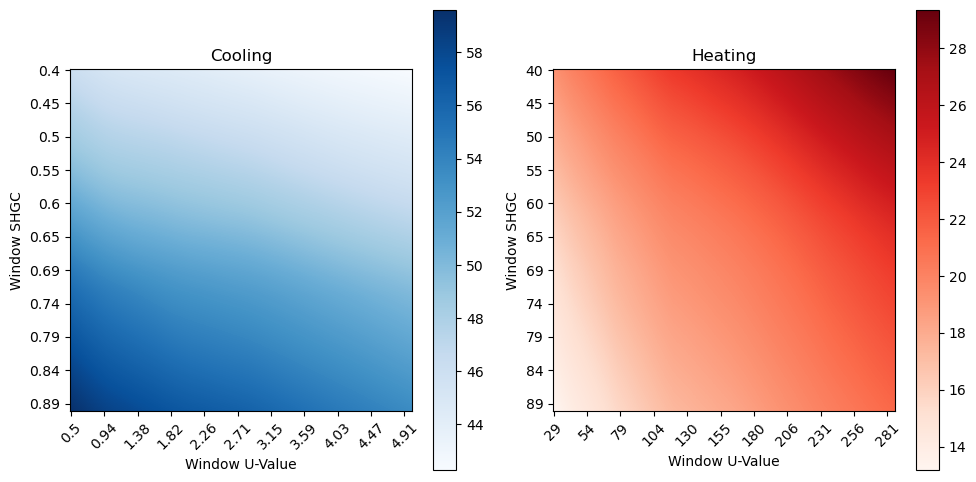

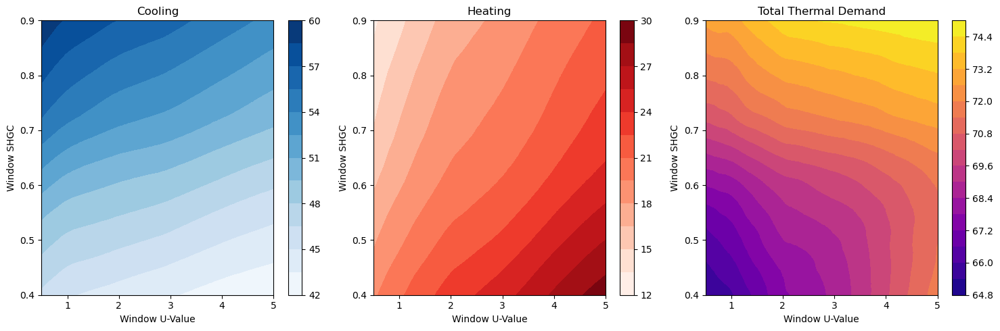

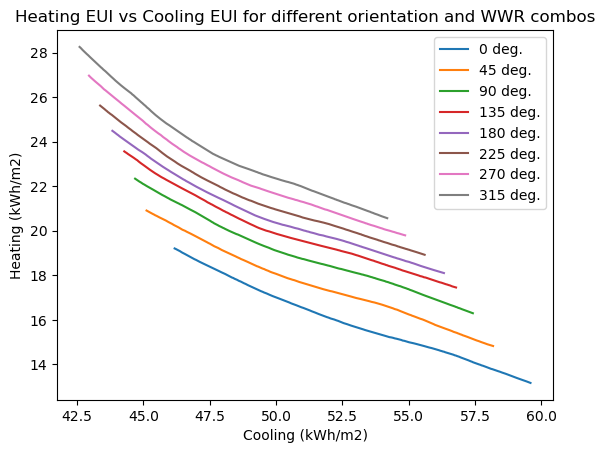

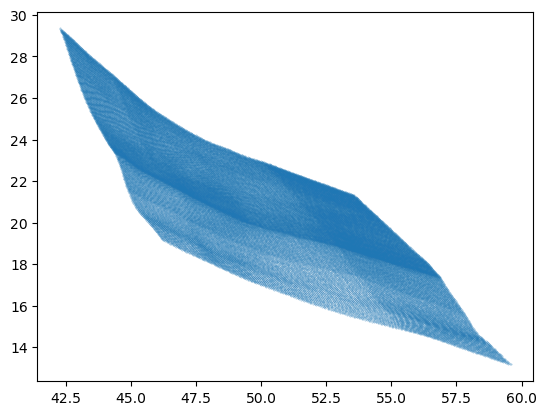

In [ ]:
data = res_a.unstack(level="WindowShgc")
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
im = ax[0].imshow(data.Cooling.values.T, cmap="Blues")
n = 25
x_tick_labels = [round(x, 2) for x in data.index.values][::n]
y_tick_labels = [round(y, 2) for y in data.Cooling.columns.get_level_values(-1)][::n]
ax[0].set_yticks(range(0, 256, 25), y_tick_labels)
ax[0].set_xticks(range(0, 256, 25), x_tick_labels, rotation=45)
ax[0].set_ylabel("Window SHGC")
ax[0].set_xlabel("Window U-Value")
ax[0].set_title("Cooling")
fig.colorbar(im, ax=ax[0])
im = ax[1].imshow(data.Heating.values.T, cmap="Reds")
n = 25
x_tick_labels = [round(x * 360 / (2 * np.pi)) for x in data.index.values][::n]
y_tick_labels = [round(y * 100) for y in data.Cooling.columns.get_level_values(-1)][::n]
ax[1].set_yticks(range(0, 256, 25), y_tick_labels)
ax[1].set_xticks(range(0, 256, 25), x_tick_labels, rotation=45)
ax[1].set_ylabel("Window SHGC")
ax[1].set_xlabel("Window U-Value")
ax[1].set_title("Heating")
# add contour plot
fig.colorbar(im, ax=ax[1])
fig.tight_layout()
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
levels = 15
im = ax[0].contourf(
    data.index,
    data.Cooling.columns,
    data.Cooling.values.T,
    levels=levels,
    cmap="Blues",
)
# ax[0].set_xticks(
#     [],
#     ["0", "90", "180", "270", "360"],
# )
# ax[0].set_yticks([0.2, 0.4, 0.6, 0.8], ["20", "40", "60", "80"])
ax[0].set_xlabel("Window U-Value")
ax[0].set_ylabel("Window SHGC")
ax[0].set_title("Cooling")
im2 = ax[1].contourf(
    data.index,
    data.Cooling.columns,
    data.Heating.values.T,
    levels=levels,
    cmap="Reds",
)
ax[1].set_xlabel("Window U-Value")
ax[1].set_ylabel("Window SHGC")
ax[1].set_title("Heating")
fig.colorbar(im2, ax=ax[1])
fig.colorbar(im, ax=ax[0])
im = ax[2].contourf(
    data.index,
    data.Cooling.columns,
    data.Cooling.values.T + data.Heating.values.T,
    levels=levels,
    cmap="plasma",
)
ax[2].set_xlabel("Window U-Value")
ax[2].set_ylabel("Window SHGC")
ax[2].set_title("Total Thermal Demand")
fig.colorbar(im, ax=ax[2])

fig.tight_layout()

plt.figure()

n = 8
for i in range(n):
    plt.plot(
        data.iloc[i * (len(data) // n) : i * (len(data) // n) + 1]
        .stack(level=-1)
        .Cooling,
        data.iloc[i * (len(data)) // n : i * (len(data) // n) + 1]
        .stack(level=-1)
        .Heating,
        # s=1.0,
        label=f"{round(i*360//n)} deg.",
        # alpha=0.5,
    )
plt.xlabel("Cooling (kWh/m2)")
plt.ylabel("Heating (kWh/m2)")
plt.title("Heating EUI vs Cooling EUI for different orientation and WWR combos")
plt.legend()

plt.figure()
plt.scatter(
    data.stack(level=-1).Cooling,
    data.stack(level=-1).Heating,
    s=0.1,
    alpha=0.5,
)

## NREL

### Single Building Demo

In [ ]:
# TODO: solar position computation; isolate and extract in climate
def calculate_dew_point(T, RH):
    # Constants for the Magnus-Tetens formula
    a = 17.62
    b = 243.12

    # Saturation vapor pressure (es)
    es = 6.112 * np.exp((a * T) / (b + T))

    # Actual vapor pressure (e)
    e = (RH / 100.0) * es

    # Dew point temperature (Td)
    Td = (b * np.log(e / 6.112)) / (a - np.log(e / 6.112))

    return Td


building_id = 546353
df_out = pd.read_parquet("c:/users/szvsw/downloads/546353-0.parquet")
df_out = df_out.set_index("timestamp", append=True)

light_cols_intensity = [
    # "out.electricity.lighting_exterior.energy_consumption_intensity",
    # "out.electricity.lighting_garage.energy_consumption_intensity",
    "out.electricity.lighting_interior.energy_consumption_intensity",
    "out.natural_gas.lighting.energy_consumption_intensity",
]
light_cols = [col.split("_intensity")[0] for col in light_cols_intensity]
elec_cols_intensity = [
    # "out.electricity.ceiling_fan.energy_consumption_intensity",
    "out.electricity.clothes_dryer.energy_consumption_intensity",
    "out.electricity.clothes_washer.energy_consumption_intensity",
    # "out.electricity.cooling_fans_pumps.energy_consumption_intensity",
    "out.electricity.cooling.energy_consumption_intensity",
    "out.electricity.dishwasher.energy_consumption_intensity",
    "out.electricity.freezer.energy_consumption_intensity",
    # "out.electricity.heating_fans_pumps.energy_consumption_intensity",
    # "out.electricity.heating_hp_bkup.energy_consumption_intensity",
    # "out.electricity.heating.energy_consumption_intensity",
    # "out.electricity.hot_tub_heater.energy_consumption_intensity",
    # "out.electricity.hot_tub_pump.energy_consumption_intensity",
    "out.electricity.hot_water.energy_consumption_intensity",
    # "out.electricity.lighting_exterior.energy_consumption_intensity",
    # "out.electricity.lighting_garage.energy_consumption_intensity",
    # "out.electricity.lighting_interior.energy_consumption_intensity",
    # "out.electricity.mech_vent.energy_consumption_intensity",
    "out.electricity.plug_loads.energy_consumption_intensity",
    # "out.electricity.pool_heater.energy_consumption_intensity",
    # "out.electricity.pool_pump.energy_consumption_intensity",
    # "out.electricity.pv.energy_consumption_intensity",
    "out.electricity.range_oven.energy_consumption_intensity",
    "out.electricity.refrigerator.energy_consumption_intensity",
    # "out.electricity.well_pump.energy_consumption_intensity",
    # "out.electricity.net.energy_consumption_intensity",
    # "out.electricity.total.energy_consumption_intensity",
]
elec_cols = [col.split("_intensity")[0] for col in elec_cols_intensity]
# sum along columns to get aggregate 15 min demand, then reshape 15min to hour and squash
lpd_sched_kW = df_out[light_cols].sum(axis=1).values.reshape(-1, 4).sum(axis=1)
epd_sched_kW = df_out[elec_cols].sum(axis=1).values.reshape(-1, 4).sum(axis=1)
area = 203
epd_W_per_m2 = epd_sched_kW.max() / area * 1000
lpd_W_per_m2 = lpd_sched_kW.max() / area * 1000
epd_sched_frac = epd_sched_kW / epd_sched_kW.max()
lpd_sched_frac = lpd_sched_kW / lpd_sched_kW.max()

df_bldgs = pd.read_hdf("c:/users/szvsw/downloads/4A_test.h5")
features = df_bldgs.xs(building_id, level="building_id").index.to_frame(index=False)
features = features.drop(columns=["climate_zone", "floors"])
features["building_id"] = building_id
for i in range(12):
    features[f"shading_{i}"] = 0
features

occ_sched = np.load("c:/users/szvsw/downloads/res_schedule.npy")[-1]
schedules = np.vstack([epd_sched_frac, lpd_sched_frac, occ_sched]).reshape(1, 3, 8760)
# remember to select correct index if using different schedule sets for different buildings
features["template_idx"] = 0
features = pd.concat([features] * 4)
features["weight"] = 0.25
features["RecoverySettings"] = 0
features["SlabRValue"] = 0.35
features["core_depth"] = 6
features["CoolingSetpoint"] = 22
winter_infil = 0.00001
summer_infil = 0.00075
features["LightingPowerDensity"] = 15
features["orientation"] = (
    np.linspace(0, 3 / 4 * 2 * np.pi, 4) + features.iloc[0].orientation
) % (2 * np.pi)
features = pd.concat([features] * 2, keys=["summer", "winter"], names=["season"])
features = features.reset_index("season")
features.loc[features.season == "summer", "Infiltration"] = summer_infil
features.loc[features.season == "winter", "Infiltration"] = winter_infil
# invert building ids for seasons so agggregation works
features.loc[features.season == "summer", "building_id"] = -features.loc[
    features.season == "summer", "building_id"
]

epw = EPW(
    # "c:/users/szvsw/downloads/USA_AR_Rogers.Muni.AP-Carter.Field.723449_TMYx.2004-2018/USA_AR_Rogers.Muni.AP-Carter.Field.723449_TMYx.2004-2018.epw"
    "c:/users/szvsw/downloads/USA_AR_Rogers.Muni.AP-Carter.Field.723449_TMY3/USA_AR_Rogers.Muni.AP-Carter.Field.723449_TMY3.epw"
)
climate = extract(epw)
cc = pd.read_csv("c:/users/szvsw/downloads/county_resources/G0500070_TMY3.csv")


channel_map = {
    "dry_bulb_temperature": "Dry Bulb Temperature [°C]",
    "dew_point_temperature": lambda data: calculate_dew_point(
        data["Dry Bulb Temperature [°C]"], data["Relative Humidity [%]"]
    ),
    "relative_humidity": "Relative Humidity [%]",
    "wind_direction": "Wind Direction [Deg]",
    "wind_speed": "Wind Speed [m/s]",
    "direct_normal_radiation": "Direct Normal Radiation [W/m2]",
    "diffuse_horizontal_radiation": "Diffuse Horizontal Radiation [W/m2]",
    "solar_azimuth": None,
    "solar_elevation": None,
    "latitude": None,
    "longitude": None,
}
for key, val in channel_map.items():
    if val is None:
        continue
    if isinstance(val, str):
        climate[surrogate.weather_transform.channel_names.index(key)] = cc[val].values
    elif callable(val):
        climate[surrogate.weather_transform.channel_names.index(key)] = val(cc)

sb_predictions, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=features,
    schedules=schedules,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
# monthly_results.loc[monthly_results.index, "Heating"] = monthly_results.loc[-monthly_results.index, "Heating"]
monthly_results["Cooling"] = monthly_results.loc[
    -monthly_results.index, "Cooling"
].values
monthly_results = monthly_results.loc[monthly_results.index > 0]
annual_results["Cooling"] = annual_results.loc[-annual_results.index, "Cooling"].values
annual_results = annual_results.loc[annual_results.index > 0]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 73.99it/s]


,Cooling,Heating
building_id,,
546353,-2.961772,1.070376


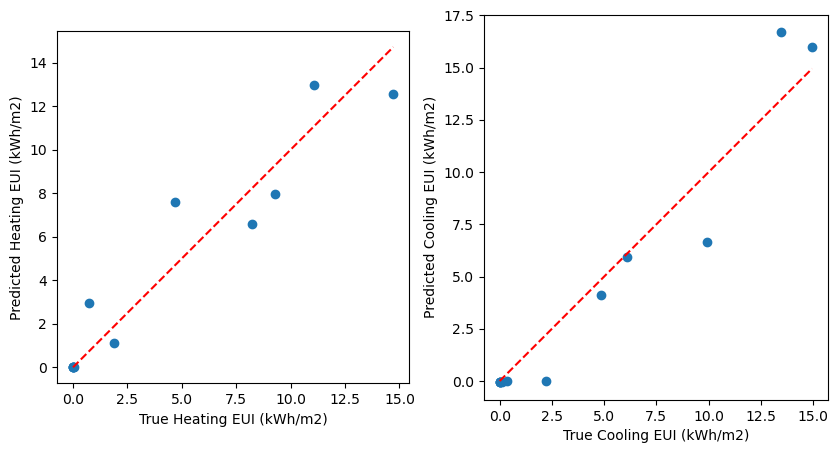

In [ ]:
y_true = df_out[
    [
        "out.load.heating.energy_delivered.kbtu",
        "out.load.cooling.energy_delivered.kbtu",
    ]
]
y_true = y_true.reset_index("bldg_id").rename(columns={"bldg_id": "building_id"})
y_true.index = y_true.index - pd.Timedelta("15min")
monthly_eui = y_true.resample("1M").sum() / 3.412 / area
monthly_eui = monthly_eui.drop(columns="building_id").rename(
    columns=lambda x: "Heating" if "heating" in x else "Cooling"
)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
for i, target in enumerate(["Heating", "Cooling"]):
    # target = "Cooling"
    y_true_col = monthly_eui[target]
    y_pred_col = monthly_results[target]
    # y_pred = sb_predictions["Perimeter"][target].mean()
    ax[i].scatter(y_true_col, y_pred_col)
    ax[i].set_aspect("equal", adjustable="box")
    ax[i].plot(
        [0, y_true_col.max()],
        [0, y_true_col.max()],
        color="red",
        linestyle="--",
    )
    ax[i].set_xlabel(f"True {target} EUI (kWh/m2)")
    ax[i].set_ylabel(f"Predicted {target} EUI (kWh/m2)")
annual_results - monthly_eui.sum()

### Automated

In [1]:
import tempfile
from concurrent.futures import ThreadPoolExecutor
from functools import partial
from pathlib import Path

import boto3
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from botocore import UNSIGNED
from botocore.client import Config
from ladybug.epw import EPW
from lightning.pytorch import Trainer
from ml.predict import predict_ubem
from ml.surrogate import Surrogate
from tqdm.autonotebook import tqdm
from weather.weather import extract

surrogate_cache = {}
parquet_cache = {}
preds_cache = {}


# TODO: solar position computation; isolate and extract in climate
def calculate_dew_point(T, RH):
    # Constants for the Magnus-Tetens formula
    a = 17.62
    b = 243.12

    # Saturation vapor pressure (es)
    es = 6.112 * np.exp((a * T) / (b + T))

    # Actual vapor pressure (e)
    e = (RH / 100.0) * es

    # Dew point temperature (Td)
    Td = (b * np.log(e / 6.112)) / (a - np.log(e / 6.112))

    return Td


def download_and_open_epw_csv(
    s3_client, bucket: str, local_output_path: Path, key: str
):
    output_path = local_output_path / Path(key).name
    s3_client.download_file(
        Bucket=bucket,
        Key=key,
        Filename=output_path.as_posix(),
    )
    return pd.read_csv(output_path)


channel_map = {
    "dry_bulb_temperature": "Dry Bulb Temperature [°C]",
    "dew_point_temperature": lambda data: calculate_dew_point(
        data["Dry Bulb Temperature [°C]"], data["Relative Humidity [%]"]
    ),
    "relative_humidity": "Relative Humidity [%]",
    "wind_direction": "Wind Direction [Deg]",
    "wind_speed": "Wind Speed [m/s]",
    "direct_normal_radiation": "Direct Normal Radiation [W/m2]",
    "diffuse_horizontal_radiation": "Diffuse Horizontal Radiation [W/m2]",
    "solar_azimuth": None,
    "solar_elevation": None,
    "latitude": None,
    "longitude": None,
}


light_cols = [
    # "out.electricity.lighting_exterior.energy_consumptiony",
    # "out.electricity.lighting_garage.energy_consumption",
    "out.electricity.lighting_interior.energy_consumption",
    "out.natural_gas.lighting.energy_consumption",
]
elec_cols = [
    # "out.electricity.ceiling_fan.energy_consumption",
    "out.electricity.clothes_dryer.energy_consumption",
    "out.electricity.clothes_washer.energy_consumption",
    # "out.electricity.cooling_fans_pumps.energy_consumption",
    "out.electricity.cooling.energy_consumption",
    "out.electricity.dishwasher.energy_consumption",
    "out.electricity.freezer.energy_consumption",
    # "out.electricity.heating_fans_pumps.energy_consumption",
    # "out.electricity.heating_hp_bkup.energy_consumption",
    # "out.electricity.heating.energy_consumption",
    # "out.electricity.hot_tub_heater.energy_consumption",
    # "out.electricity.hot_tub_pump.energy_consumption",
    # "out.electricity.hot_water.energy_consumption",
    # "out.electricity.lighting_exterior.energy_consumption",
    # "out.electricity.lighting_garage.energy_consumption",
    # "out.electricity.lighting_interior.energy_consumption",
    # "out.electricity.mech_vent.energy_consumption",
    "out.electricity.plug_loads.energy_consumption",
    # "out.electricity.pool_heater.energy_consumption",
    # "out.electricity.pool_pump.energy_consumption",
    # "out.electricity.pv.energy_consumption",
    "out.electricity.range_oven.energy_consumption",
    "out.electricity.refrigerator.energy_consumption",
    # "out.electricity.well_pump.energy_consumption",
    # "out.electricity.net.energy_consumption",
    # "out.electricity.total.energy_consumption",
]
res_thermal_output_cols = [
    "out.load.heating.energy_delivered.kbtu",
    "out.load.cooling.energy_delivered.kbtu",
]


def download_and_open_parquet(
    key: str,
    s3_client,
    bucket: str,
):
    with tempfile.TemporaryDirectory() as tmpdir:
        if key in parquet_cache:
            return parquet_cache[key]
        output_path = Path(tmpdir) / Path(key).name
        s3_client.download_file(
            Bucket=bucket,
            Key=key,
            Filename=output_path.as_posix(),
        )
        df_out = pd.read_parquet(output_path)
        df_out.set_index("timestamp", append=True, inplace=True)
        df_out = df_out[light_cols + elec_cols + res_thermal_output_cols]
        assert df_out.index.names == ["bldg_id", "timestamp"]
        assert df_out.index.get_level_values("bldg_id").nunique() == 1
        df_out.reset_index("bldg_id", drop=True, inplace=True)
        df_out.index = df_out.index - pd.Timedelta("15min")
        df_out = df_out.resample("1H").sum()
        parquet_cache[key] = df_out
        return df_out


folder = Path("c:/users/szvsw/downloads")
resstock_path = folder / "resstock.h5"
lookup_path = folder / "spatial_tract_lookup_table.csv"

names = [
    "map_of_pumas_in_census_region_3_south.geojson",
    "map_of_pumas_in_census_region_1_northeast.geojson",
    "map_of_pumas_in_census_region_2_midwest.geojson",
    "map_of_pumas_in_census_region_4_west.geojson",
]
gdfs = []
for name in names:
    gdf = gpd.read_file(folder / name)
    gdfs.append(gdf)
gdf = pd.concat(gdfs)

rs_df = pd.read_hdf(resstock_path, key="features")
rs_df.set_index(["building_id", "county"], inplace=True)
rs_df.drop_duplicates(inplace=True)
tract_df = pd.read_csv(lookup_path).set_index("nhgis_county_gisjoin")
county_list = rs_df.index.get_level_values("county").unique().to_list()
counties_by_cz = {
    cz: rs_df[rs_df.climate_zone == cz]
    .index.get_level_values("county")
    .unique()
    .tolist()
    for cz in rs_df.climate_zone.unique()
}
czs = sorted(list(counties_by_cz.keys()))
run_counties = []
print(f"{len(county_list)} counties in resstock data, {len(rs_df)} buildings")

Couldn't import dot_parser, loading of dot files will not be possible.
1299 counties in resstock data, 320876 buildings


In [2]:
run_counties = []
counted_counties = (
    rs_df.set_index("climate_zone", append=True)
    .groupby(["climate_zone", "county"])
    .count()[["area"]]
    .rename(columns={"area": "count"})
)
counted_counties = (
    counted_counties.reset_index(["climate_zone"])
    .sort_values(["climate_zone", "count"], ascending=False)
    .reset_index()
    .set_index("climate_zone")
)
for cz in czs:
    counties_in_cz = counted_counties.loc[cz]

    run_counties.extend(counties_in_cz.iloc[:3]["county"].values.tolist())

  0%|          | 0/45 [00:00<?, ?it/s]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-


 -------------------- G1200860 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1200860 has 25 PUMAs; lat/lon may be off
GISMATCH                                                   1208604
GEOID                                                      1208604
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         08604
Name             Miami-Dade County (Northeast)--Aventura City &...
state_abbr                                                      FL
division_name                                       South Atlantic
region_name                                                  South
puma_tsv                                                 FL, 08604
geometry         (POLYGON ((-80.13908499979787 25.8839709998045...
Name: G12008604, dtype: object
done loading data for county.
Preparing EPD/

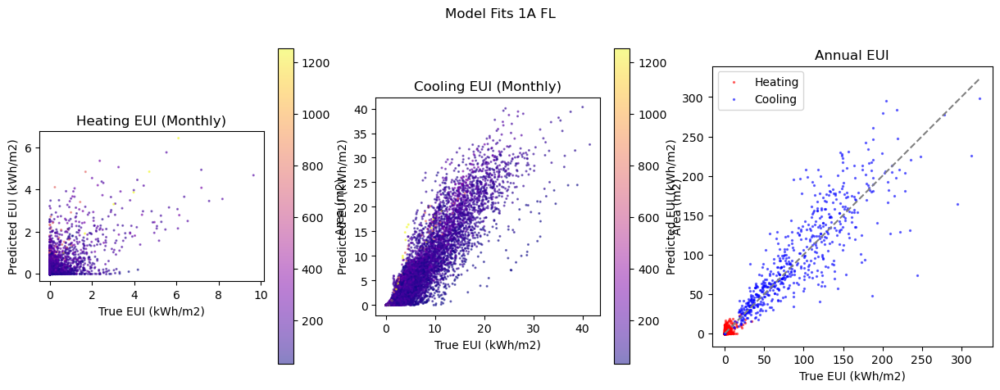

  2%|▏         | 1/45 [00:07<05:31,  7.53s/it]

annual urban euis
              True       Pred
Name                         
Cooling  85.266538  94.840498
Heating   2.343216   3.554418
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   33.7  -4.2  31.1    49.9   4.2  3.9
Heating  190.7 -17.0   3.7   282.4  17.0  0.5

 -------------------- G1200110 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1200110 has 14 PUMAs; lat/lon may be off
GISMATCH                                                   1201103
GEOID                                                      1201103
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         01103
Name             Broward County--Deerfield, Pompano Beach (Nort...
state_abbr                

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
177 setpoints are crossed over.
429 setpoints are out of bounds (heating: 294, cooling:188).
454 buildings have setpoint errors.
546 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 546/3350 buildings in G1200110 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 137/137 [00:02<00:00, 49.05it/s]
Beginning evaluation...
Done evaluating.


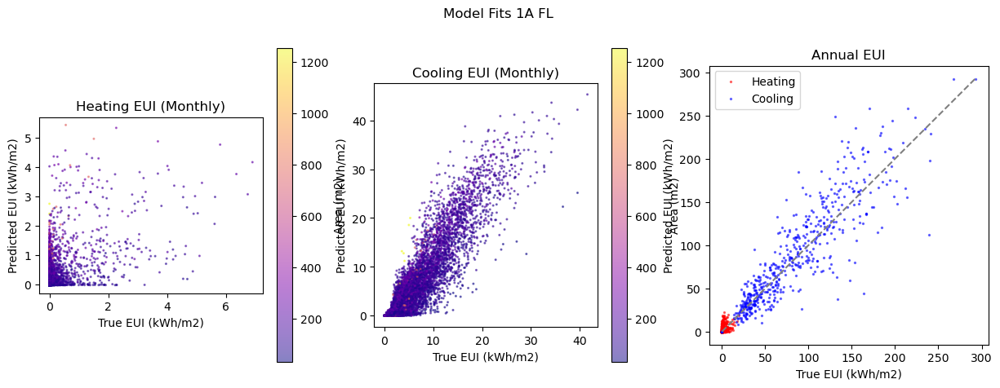

  4%|▍         | 2/45 [02:01<50:24, 70.34s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of 

annual urban euis
              True       Pred
Name                         
Cooling  76.675266  84.302298
Heating   1.453384   3.903898
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   32.2  -4.7  26.7    54.9   4.7  3.9
Heating  271.8 -75.2   4.1   406.7  75.2  0.5

 -------------------- G1200870 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1208700
GEOID                                                      1208700
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         08700
Name             Miami-Dade (South/Outside Urban Development Bo...
state_abbr                                                      FL
division

100%|██████████| 219/219 [00:22<00:00,  9.69it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
29 setpoints are crossed over.
119 setpoints are out of bounds (heating: 101, cooling:36).
123 buildings have setpoint errors.
96 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 96/219 buildings in G1200870 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Predicting DataLoader 0: 100%|██████████| 24/24 [00:00<00:00, 53.52it/s]
Beginning evaluation...
Done evaluating.


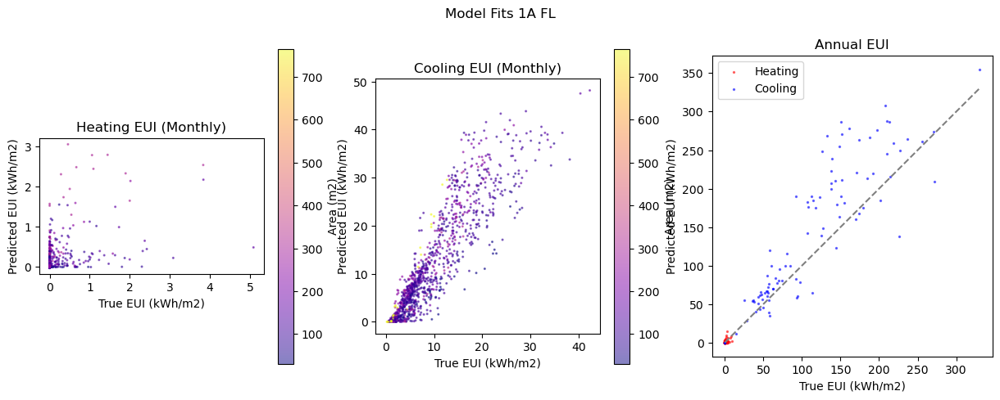

  7%|▋         | 3/45 [02:27<34:58, 49.95s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of 

annual urban euis
               True        Pred
Name                           
Cooling  105.455973  141.551618
Heating    1.067590    1.699383
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   44.6 -25.2  51.3    60.4  25.2  6.0
Heating  217.2 -17.1   2.2   397.6  17.1  0.4

 -------------------- G4802010 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4802010 has 38 PUMAs; lat/lon may be off
GISMATCH                                                   4804602
GEOID                                                      4804602
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         04602
Name             Houston City (East Central)--East of I-45 & In...
state_abbr        

100%|██████████| 219/219 [00:26<00:00,  8.22it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
47 setpoints are crossed over.
80 setpoints are out of bounds (heating: 52, cooling:32).
87 buildings have setpoint errors.
132 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 132/6960 buildings in G4802010 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Predicting DataLoader 0: 100%|██████████| 33/33 [00:00<00:00, 49.35it/s]
Beginning evaluation...
Done evaluating.


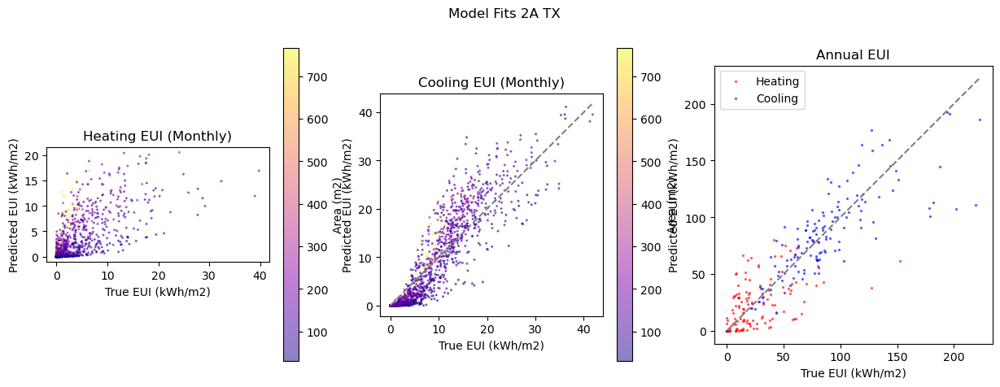

  9%|▉         | 4/45 [02:57<28:48, 42.16s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of 

annual urban euis
              True       Pred
Name                         
Cooling  75.992660  80.392154
Heating  24.847269  32.124653
building errors
        Annual            Monthly          
        CVRMSE NMBE  RMSE  CVRMSE NMBE RMSE
Name                                       
Cooling   28.3  2.0  25.1    51.0 -2.0  3.8
Heating   87.8  9.5  23.3   138.9 -9.5  3.1

 -------------------- G4800290 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4800290 has 16 PUMAs; lat/lon may be off
GISMATCH                                                   4805901
GEOID                                                      4805901
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         05901
Name                               San Antonio City (Central) PUMA
state_abbr                          

100%|██████████| 219/219 [00:25<00:00,  8.62it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
44 setpoints are crossed over.
74 setpoints are out of bounds (heating: 40, cooling:41).
82 buildings have setpoint errors.
137 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 137/2803 buildings in G4800290 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 35/35 [00:00<00:00, 45.32it/s]
Beginning evaluation...
Done evaluating.


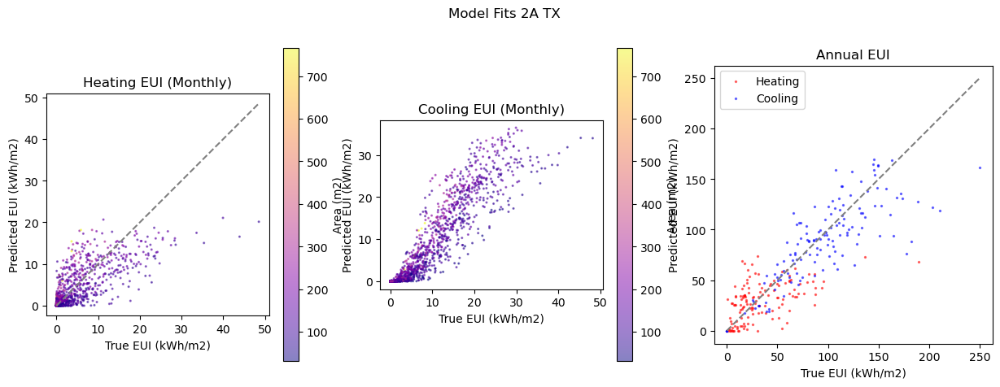

 11%|█         | 5/45 [03:27<25:03, 37.59s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of 

annual urban euis
              True       Pred
Name                         
Cooling  87.301252  86.459126
Heating  32.944540  34.537703
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   29.3   7.5  28.3    45.7  -7.5  3.8
Heating   74.8  12.7  25.4   118.0 -12.7  3.3

 -------------------- G1200990 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1200990 has 11 PUMAs; lat/lon may be off
GISMATCH                                                   1209901
GEOID                                                      1209901
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         09901
Name                            Palm Beach County (Northeast) PUMA
state_abbr                

100%|██████████| 219/219 [00:24<00:00,  8.80it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
38 setpoints are crossed over.
97 setpoints are out of bounds (heating: 77, cooling:37).
107 buildings have setpoint errors.
112 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 112/2779 buildings in G1200990 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 28/28 [00:00<00:00, 43.65it/s]
Beginning evaluation...
Done evaluating.


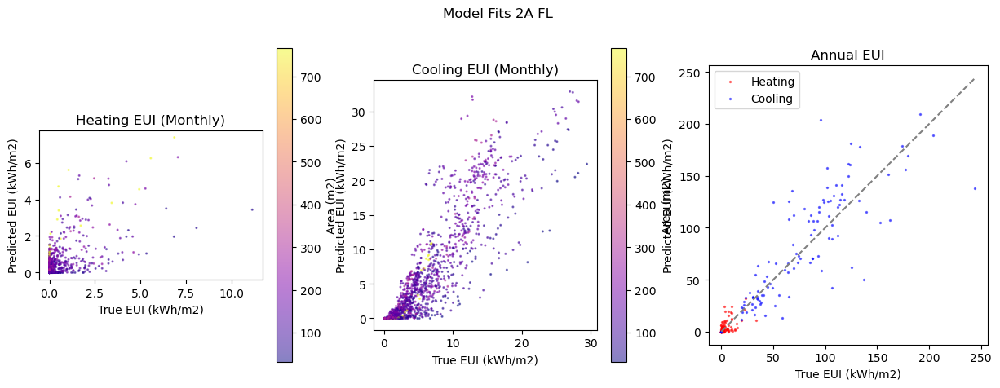

 13%|█▎        | 6/45 [03:55<22:28, 34.58s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of 

annual urban euis
              True       Pred
Name                         
Cooling  70.194469  77.287949
Heating   4.045729   6.305836
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   38.4  -4.1  29.7    58.7   4.1  4.0
Heating  153.4 -16.6   5.6   231.9  16.6  0.7

 -------------------- G4804790 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4806301
GEOID                                                      4806301
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         06301
Name             South Texas Development Council (North)--Webb ...
state_abbr                                                      TX
division

100%|██████████| 219/219 [00:25<00:00,  8.61it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
31 setpoints are crossed over.
61 setpoints are out of bounds (heating: 44, cooling:19).
65 buildings have setpoint errors.
154 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 154/322 buildings in G4804790 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 39/39 [00:00<00:00, 41.91it/s]
Beginning evaluation...
Done evaluating.


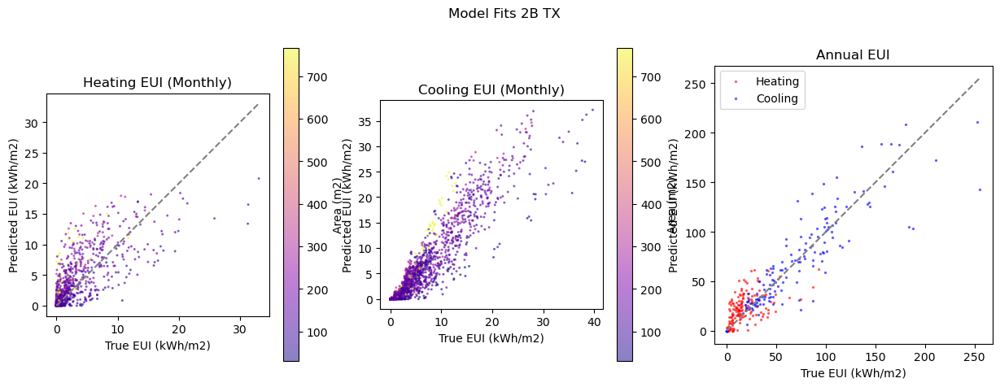

 16%|█▌        | 7/45 [04:25<20:52, 32.95s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of 

annual urban euis
              True       Pred
Name                         
Cooling  63.855065  69.925880
Heating  16.351448  26.694438
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   31.7   1.3  22.2    48.4  -1.3  3.0
Heating   89.5 -29.9  15.8   153.8  29.9  2.3

 -------------------- G0600250 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    602500
GEOID                                                      0602500
STATEFIP                                                        06
State                                                   California
PUMA                                                         02500
Name                          Imperial County--El Centro City PUMA
state_abbr                                                      CA
division

100%|██████████| 219/219 [00:24<00:00,  8.89it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
26 setpoints are crossed over.
98 setpoints are out of bounds (heating: 80, cooling:28).
99 buildings have setpoint errors.
120 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 120/235 buildings in G0600250 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 30/30 [00:00<00:00, 37.02it/s]
Beginning evaluation...
Done evaluating.


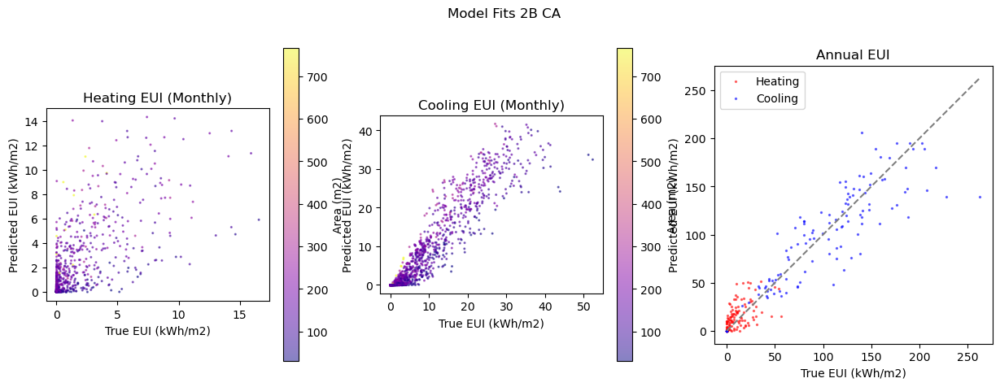

 18%|█▊        | 8/45 [04:54<19:28, 31.58s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of 

annual urban euis
              True       Pred
Name                         
Cooling  90.563366  93.622638
Heating  10.781488  17.917196
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   27.7   4.1  28.1    41.6  -4.1  3.8
Heating  117.6 -34.8  12.9   190.3  34.8  1.8

 -------------------- G4804650 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4806200
GEOID                                                      4806200
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         06200
Name                    Middle Rio Grande Development Council PUMA
state_abbr                                                      TX
division

100%|██████████| 77/77 [00:08<00:00,  9.11it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
8 setpoints are crossed over.
27 setpoints are out of bounds (heating: 23, cooling:5).
28 buildings have setpoint errors.
49 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 49/77 buildings in G4804650 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 27.35it/s]
Beginning evaluation...
Done evaluating.


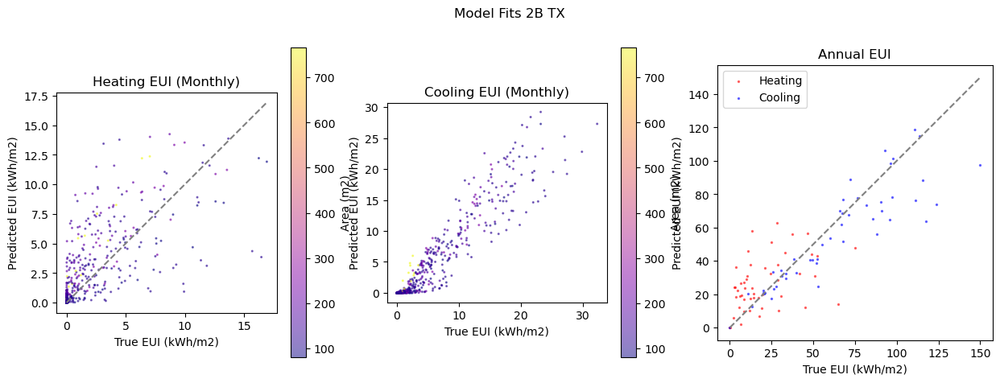

 20%|██        | 9/45 [05:05<15:08, 25.22s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of 

annual urban euis
              True       Pred
Name                         
Cooling  52.571504  47.390215
Heating  18.670628  28.836003
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   28.7  13.3  18.2    44.2 -13.3  2.4
Heating   92.5 -30.1  18.8   139.3  30.1  2.4

 -------------------- G4801130 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4801130 has 22 PUMAs; lat/lon may be off
GISMATCH                                                   4802306
GEOID                                                      4802306
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         02306
Name             Dallas (Northeast) & Mesquite (North) Cities--...
state_abbr                

100%|██████████| 77/77 [00:09<00:00,  7.96it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
20 setpoints are crossed over.
37 setpoints are out of bounds (heating: 9, cooling:30).
40 buildings have setpoint errors.
37 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 37/4015 buildings in G4801130 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 29.08it/s]
Beginning evaluation...
Done evaluating.


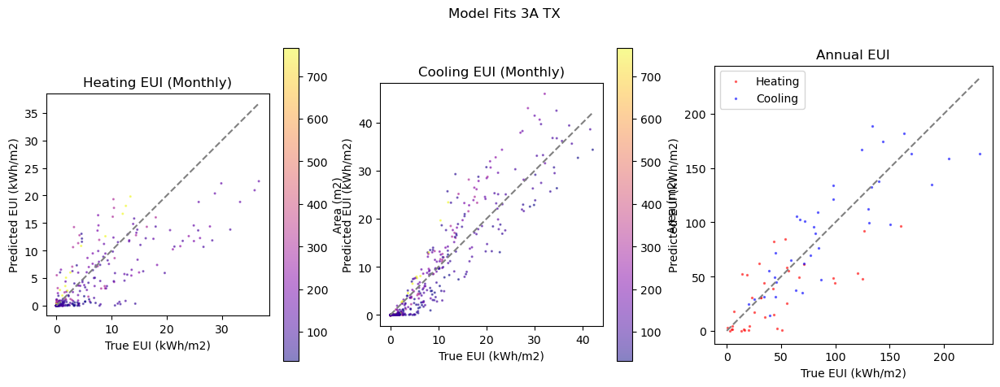

 22%|██▏       | 10/45 [05:17<12:23, 21.24s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling  78.872159  88.504160
Heating  47.707823  43.858262
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   30.9   0.6  29.5    48.6  -0.6  3.9
Heating   69.1  26.8  31.2   105.1 -26.8  4.0

 -------------------- G4804390 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4804390 has 16 PUMAs; lat/lon may be off
GISMATCH                                                   4802512
GEOID                                                      4802512
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         02512
Name             Fort Worth City (North Central) & Haltom City ...
state_abbr                

100%|██████████| 77/77 [00:09<00:00,  8.18it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
10 setpoints are crossed over.
37 setpoints are out of bounds (heating: 16, cooling:27).
38 buildings have setpoint errors.
39 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 39/3050 buildings in G4804390 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 19.72it/s]
Beginning evaluation...
Done evaluating.


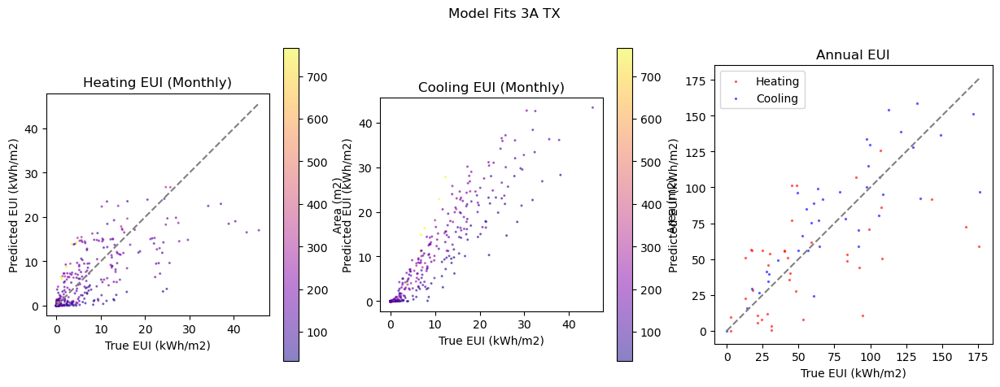

 24%|██▍       | 11/45 [05:30<10:30, 18.54s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling  68.924317  83.393764
Heating  54.655620  55.744843
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   32.4  -5.5  25.4    52.7   5.5  3.5
Heating   70.5  15.3  39.6   103.0 -15.3  4.8

 -------------------- G1301210 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1301210 has 8 PUMAs; lat/lon may be off
GISMATCH                                                   1301006
GEOID                                                      1301006
STATEFIP                                                        13
State                                                      Georgia
PUMA                                                         01006
Name             Atlanta Regional Commission (Central)--Fulton ...
state_abbr                 

100%|██████████| 77/77 [00:11<00:00,  6.76it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
26 setpoints are crossed over.
35 setpoints are out of bounds (heating: 12, cooling:28).
39 buildings have setpoint errors.
38 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 38/1852 buildings in G1301210 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 25.43it/s]
Beginning evaluation...
Done evaluating.


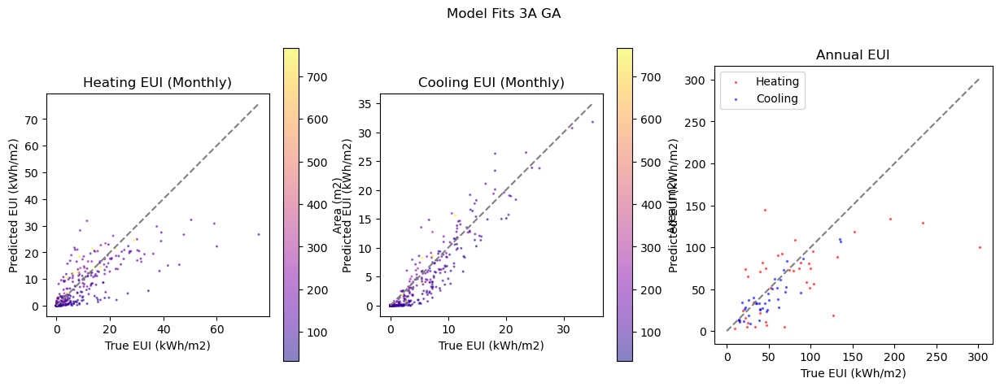

 27%|██▋       | 12/45 [05:44<09:27, 17.20s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
             True       Pred
Name                        
Cooling  40.56537  36.266265
Heating  78.23701  74.222873
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   32.5  18.1  16.0    50.5 -18.1  2.1
Heating   68.3  20.9  52.7    99.0 -20.9  6.4

 -------------------- G0600370 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600370 has 69 PUMAs; lat/lon may be off
GISMATCH                                                    603708
GEOID                                                      0603708
STATEFIP                                                        06
State                                                   California
PUMA                                                         03708
Name             Los Angeles County (North)--LA City (Northeast...
state_abbr                    

100%|██████████| 77/77 [00:08<00:00,  9.20it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
23 setpoints are crossed over.
38 setpoints are out of bounds (heating: 11, cooling:30).
38 buildings have setpoint errors.
39 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 39/14394 buildings in G0600370 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 30.56it/s]
Beginning evaluation...
Done evaluating.


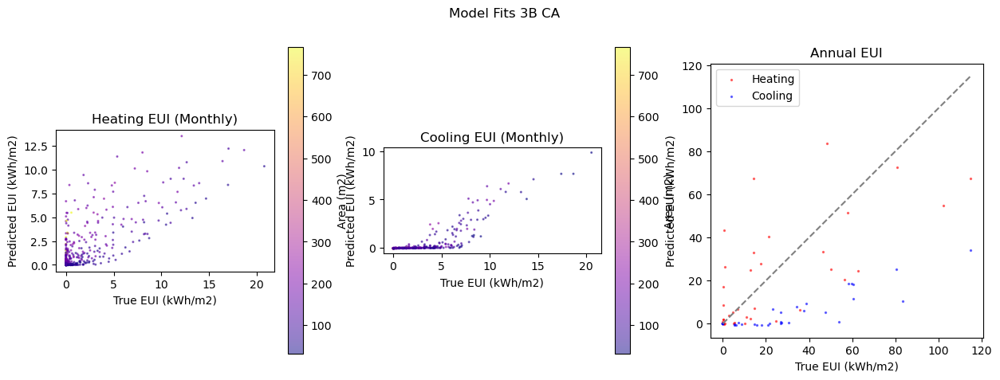

 29%|██▉       | 13/45 [05:55<08:10, 15.34s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling  20.865671   3.322294
Heating  20.069936  25.275510
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  115.6  82.7  30.1   109.6 -82.7  3.3
Heating   99.5   9.0  21.4   120.8  -9.0  2.2

 -------------------- G0600730 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600730 has 22 PUMAs; lat/lon may be off
GISMATCH                                                    607316
GEOID                                                      0607316
STATEFIP                                                        06
State                                                   California
PUMA                                                         07316
Name             San Diego County (South Central)--San Diego Ci...
state_abbr                

100%|██████████| 77/77 [00:08<00:00,  9.05it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
22 setpoints are crossed over.
38 setpoints are out of bounds (heating: 11, cooling:30).
38 buildings have setpoint errors.
39 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 39/4892 buildings in G0600730 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 23.46it/s]
Beginning evaluation...
Done evaluating.


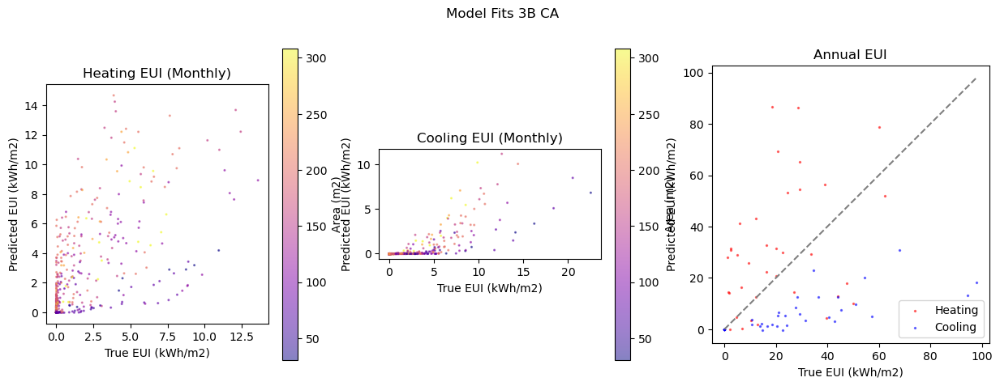

 31%|███       | 14/45 [06:06<07:16, 14.08s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling  25.156224   6.710971
Heating  18.835377  33.442773
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  108.6  78.0  28.3   117.0 -78.0  3.4
Heating  132.9 -50.6  25.5   166.9  50.6  2.7

 -------------------- G0600590 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600590 has 18 PUMAs; lat/lon may be off
GISMATCH                                                    605906
GEOID                                                      0605906
STATEFIP                                                        06
State                                                   California
PUMA                                                         05906
Name             Orange County (North)--Yorba Linda, La Habra &...
state_abbr                

100%|██████████| 77/77 [00:08<00:00,  8.64it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
17 setpoints are crossed over.
32 setpoints are out of bounds (heating: 9, cooling:28).
35 buildings have setpoint errors.
42 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 42/4421 buildings in G0600590 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Predicting DataLoader 0: 100%|██████████| 11/11 [00:00<00:00, 51.05it/s]
Beginning evaluation...
Done evaluating.


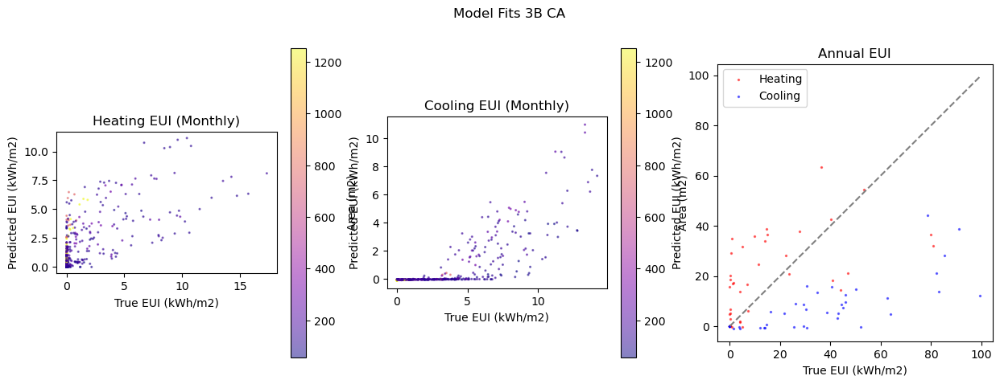

 33%|███▎      | 15/45 [06:17<06:37, 13.25s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling  22.820524   5.064682
Heating   9.582913  21.632957
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  100.1  77.9  34.1   101.6 -77.9  3.5
Heating  127.6 -29.9  18.3   161.6  29.9  2.0

 -------------------- G0600850 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600850 has 14 PUMAs; lat/lon may be off
GISMATCH                                                    608509
GEOID                                                      0608509
STATEFIP                                                        06
State                                                   California
PUMA                                                         08509
Name             Santa Clara County (Central)--San Jose City (N...
state_abbr                

100%|██████████| 77/77 [00:08<00:00,  9.20it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
11 setpoints are crossed over.
34 setpoints are out of bounds (heating: 6, cooling:29).
34 buildings have setpoint errors.
43 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 43/2689 buildings in G0600850 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Predicting DataLoader 0: 100%|██████████| 11/11 [00:00<00:00, 21.66it/s]
Beginning evaluation...
Done evaluating.


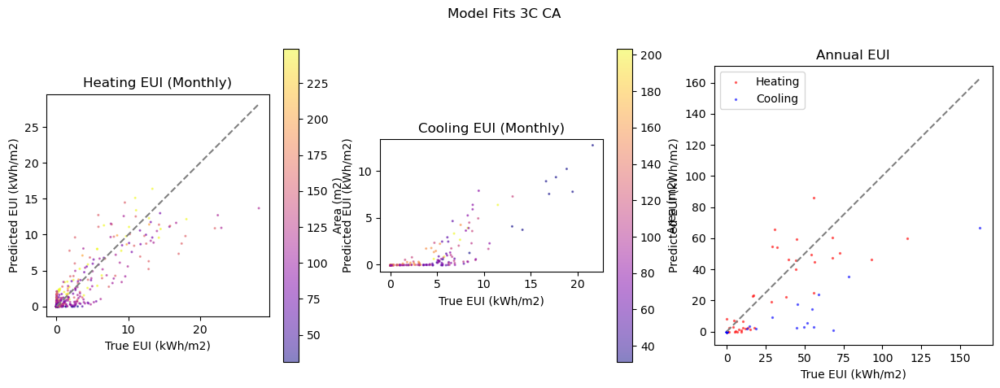

 36%|███▌      | 16/45 [06:28<06:05, 12.60s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling  12.356040   3.036838
Heating  31.423492  28.455624
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  149.8  74.6  26.0    95.9 -74.6  4.3
Heating   63.8  15.7  17.1    93.3 -15.7  2.1

 -------------------- G0600010 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600010 has 10 PUMAs; lat/lon may be off
GISMATCH                                                    600103
GEOID                                                      0600103
STATEFIP                                                        06
State                                                   California
PUMA                                                         00103
Name             Alameda County (Northeast)--Oakland (East) & P...
state_abbr                

100%|██████████| 77/77 [00:09<00:00,  8.49it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
9 setpoints are crossed over.
38 setpoints are out of bounds (heating: 8, cooling:33).
38 buildings have setpoint errors.
39 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 39/2443 buildings in G0600010 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 26.10it/s]
Beginning evaluation...
Done evaluating.


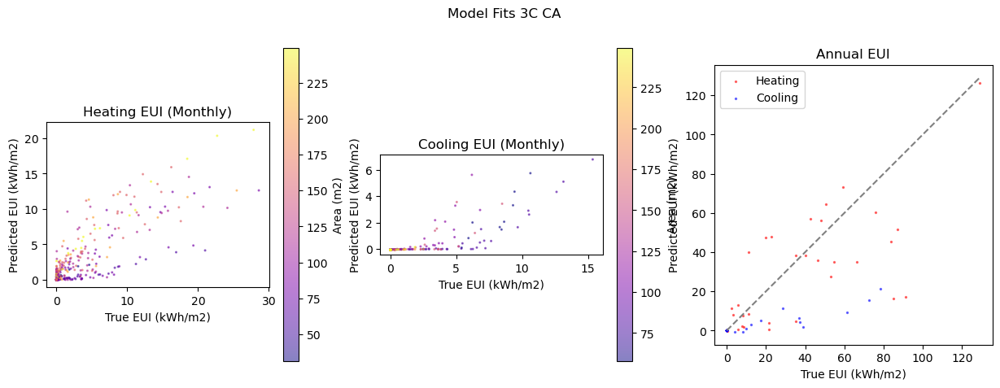

 38%|███▊      | 17/45 [06:40<05:45, 12.35s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling   8.442786   1.514382
Heating  34.128917  30.408688
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  177.2  80.6  18.4   116.3 -80.6  3.3
Heating   71.9  20.9  22.7   100.4 -20.9  3.0

 -------------------- G0600750 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600750 has 7 PUMAs; lat/lon may be off
GISMATCH                                                    607502
GEOID                                                      0607502
STATEFIP                                                        06
State                                                   California
PUMA                                                         07502
Name             San Francisco County (North & East)--North Bea...
state_abbr                 

100%|██████████| 77/77 [00:07<00:00, 10.01it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
11 setpoints are crossed over.
35 setpoints are out of bounds (heating: 16, cooling:26).
36 buildings have setpoint errors.
41 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 41/1586 buildings in G0600750 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 11/11 [00:00<00:00, 33.98it/s]
Beginning evaluation...
Done evaluating.


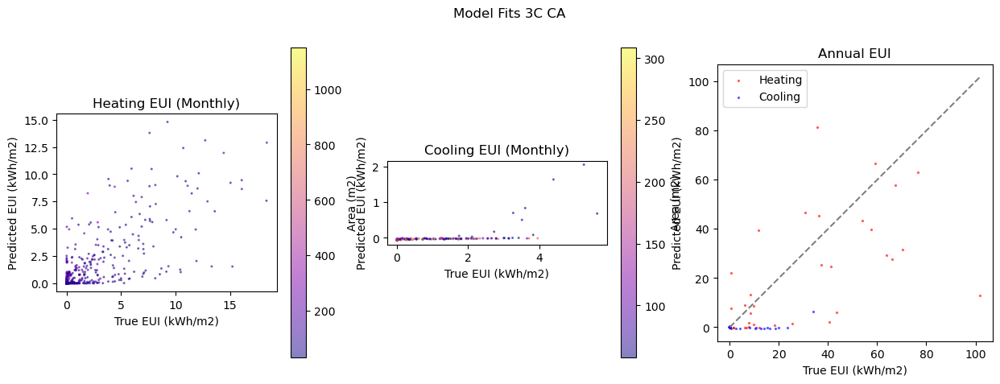

 40%|████      | 18/45 [06:50<05:15, 11.70s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling   3.592076  -0.071605
Heating  20.377553  15.988261
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  194.4  99.4   9.0   137.5 -99.4  1.6
Heating   91.1  30.4  22.7   111.2 -30.4  2.4

 -------------------- G3600470 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G3600470 has 18 PUMAs; lat/lon may be off
GISMATCH                                                   3604004
GEOID                                                      3604004
STATEFIP                                                        36
State                                                     New York
PUMA                                                         04004
Name             NYC-Brooklyn Community District 2--Brooklyn He...
state_abbr                

100%|██████████| 77/77 [00:08<00:00,  8.65it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
25 setpoints are crossed over.
42 setpoints are out of bounds (heating: 13, cooling:34).
44 buildings have setpoint errors.
33 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 33/4189 buildings in G3600470 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 9/9 [00:00<00:00, 23.53it/s]
Beginning evaluation...
Done evaluating.


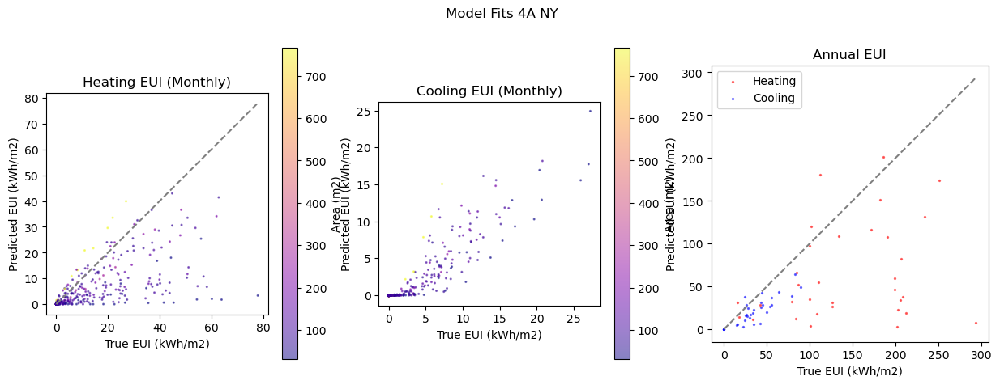

 42%|████▏     | 19/45 [07:02<05:03, 11.66s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True       Pred
Name                          
Cooling   30.476070  22.902011
Heating  135.312174  89.418961
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   53.0  39.4   18.9    76.0 -39.4   2.6
Heating   76.5  54.9  109.2   113.6 -54.9  13.5

 -------------------- G3600610 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G3600610 has 10 PUMAs; lat/lon may be off
GISMATCH                                                   3603810
GEOID                                                      3603810
STATEFIP                                                        36
State                                                     New York
PUMA                                                         03810
Name             NYC-Manhattan Community District 1 & 2--Batter...
state_abbr  

100%|██████████| 77/77 [00:07<00:00, 10.23it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
19 setpoints are crossed over.
46 setpoints are out of bounds (heating: 22, cooling:38).
47 buildings have setpoint errors.
30 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 30/3512 buildings in G3600610 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 8/8 [00:00<00:00, 22.99it/s]
Beginning evaluation...
Done evaluating.


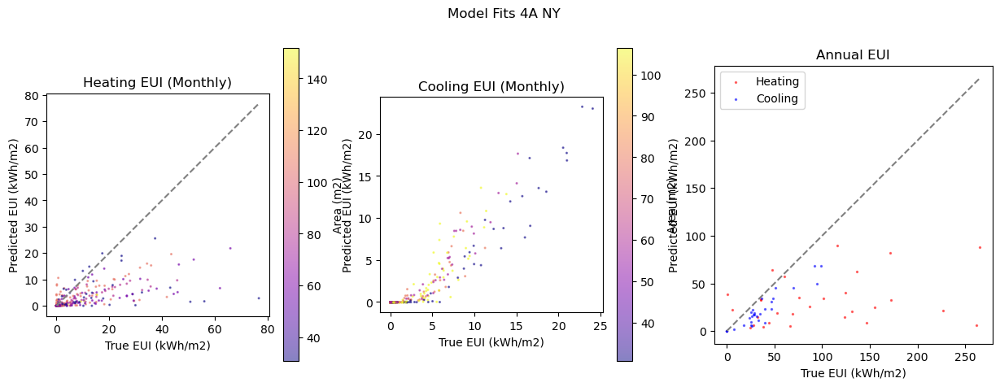

 44%|████▍     | 20/45 [07:12<04:40, 11.21s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling  29.436516  16.931414
Heating  86.015121  29.085939
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   49.9  40.3  17.5    65.5 -40.3   2.2
Heating   98.9  67.8  93.4   147.4 -67.8  11.6

 -------------------- G3600810 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G3600810 has 14 PUMAs; lat/lon may be off
GISMATCH                                                   3604109
GEOID                                                      3604109
STATEFIP                                                        36
State                                                     New York
PUMA                                                         04109
Name             NYC-Queens Community District 2--Sunnyside & W...
state_abbr           

100%|██████████| 77/77 [00:10<00:00,  7.57it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
16 setpoints are crossed over.
40 setpoints are out of bounds (heating: 12, cooling:33).
40 buildings have setpoint errors.
37 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 37/3489 buildings in G3600810 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 27.59it/s]
Beginning evaluation...
Done evaluating.


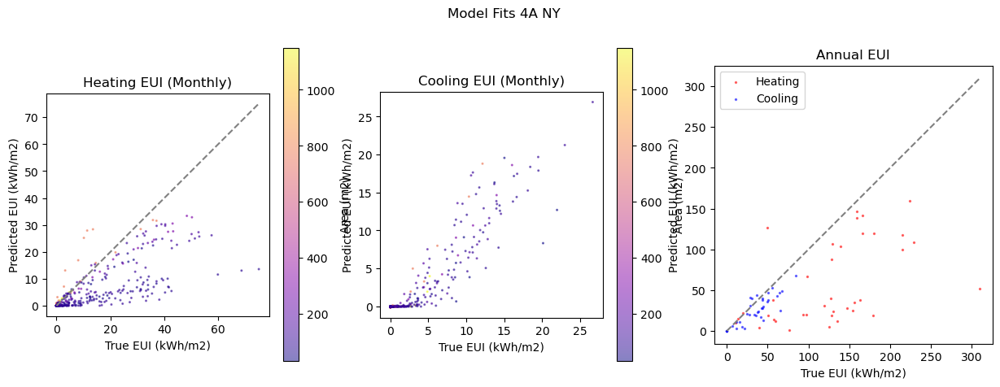

 47%|████▋     | 21/45 [07:25<04:42, 11.77s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True       Pred
Name                          
Cooling   28.763320  22.263841
Heating  112.262255  77.937199
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   41.7  27.0  14.3    65.5 -27.0   2.2
Heating   71.2  54.4  90.6   106.7 -54.4  11.3

 -------------------- G0600170 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    601700
GEOID                                                      0601700
STATEFIP                                                        06
State                                                   California
PUMA                                                         01700
Name                        El Dorado County--El Dorado Hills PUMA
state_abbr                                                      CA

100%|██████████| 77/77 [00:09<00:00,  7.91it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
9 setpoints are crossed over.
39 setpoints are out of bounds (heating: 25, cooling:22).
40 buildings have setpoint errors.
37 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 37/367 buildings in G0600170 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 23.34it/s]
Beginning evaluation...
Done evaluating.


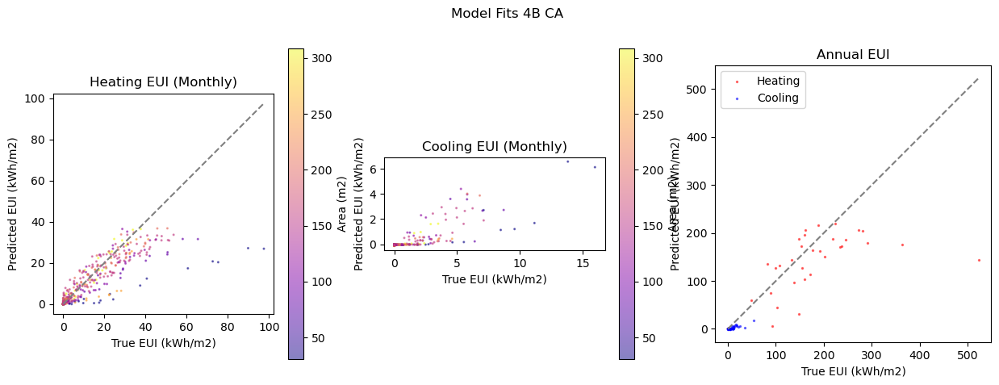

 49%|████▉     | 22/45 [07:38<04:36, 12.00s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    7.048891    1.474932
Heating  143.600523  122.097198
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  116.4  76.7  11.0   162.6 -76.7  1.6
Heating   53.7  22.5  84.3    69.3 -22.5  9.1

 -------------------- G4803810 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4800300
GEOID                                                      4800300
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         00300
Name             Panhandle Regional Planning Commission--Randal...
state_abbr                                                      TX


100%|██████████| 77/77 [00:09<00:00,  8.09it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
17 setpoints are crossed over.
32 setpoints are out of bounds (heating: 12, cooling:25).
33 buildings have setpoint errors.
44 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 44/221 buildings in G4803810 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 11/11 [00:00<00:00, 46.24it/s]
Beginning evaluation...
Done evaluating.


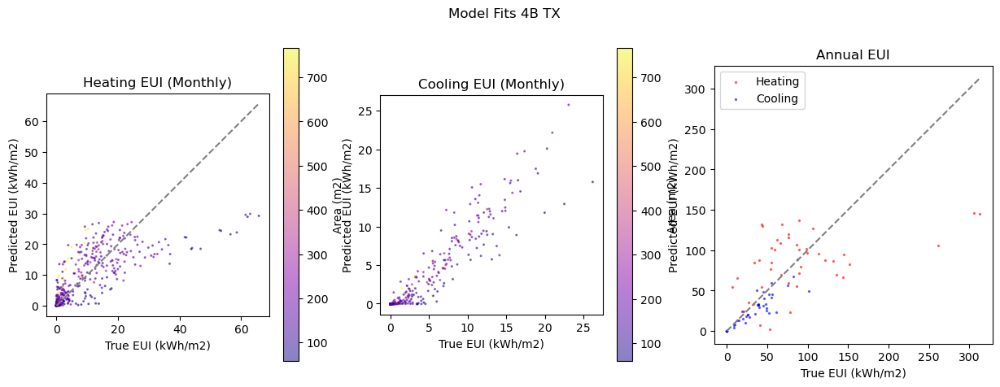

 51%|█████     | 23/45 [07:50<04:23, 11.99s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling  27.589976  22.195902
Heating  76.432244  88.370616
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   41.8  23.1  13.8    54.2 -23.1  1.9
Heating   67.3   4.5  59.0    95.3  -4.5  6.9

 -------------------- G4803750 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4800200
GEOID                                                      4800200
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         00200
Name             Panhandle Regional Planning Commission--Potter...
state_abbr                                                      TX
division

100%|██████████| 77/77 [00:10<00:00,  7.36it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
16 setpoints are crossed over.
43 setpoints are out of bounds (heating: 16, cooling:32).
43 buildings have setpoint errors.
34 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 34/202 buildings in G4803750 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 9/9 [00:00<00:00, 22.73it/s]
Beginning evaluation...
Done evaluating.


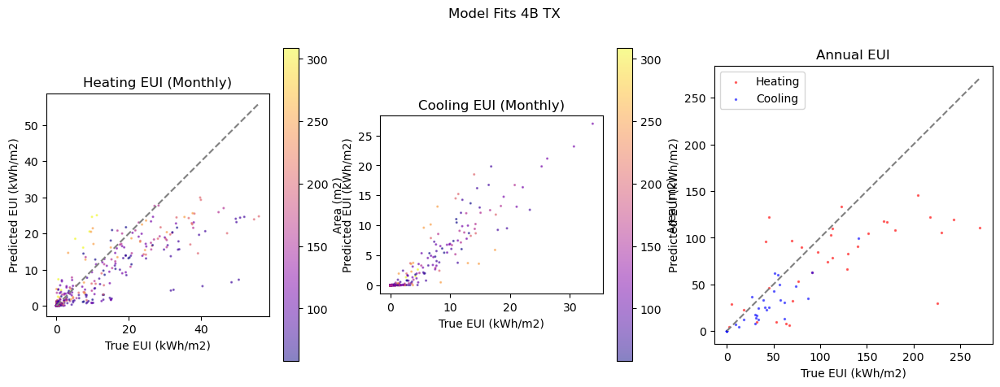

 53%|█████▎    | 24/45 [08:03<04:19, 12.35s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True       Pred
Name                          
Cooling   34.726198  22.808396
Heating  119.982889  87.973968
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   54.9  34.3  19.6    67.0 -34.3  2.7
Heating   58.7  33.3  67.1    83.5 -33.3  8.0

 -------------------- G5300330 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G5300330 has 16 PUMAs; lat/lon may be off
GISMATCH                                                   5311602
GEOID                                                      5311602
STATEFIP                                                        53
State                                                   Washington
PUMA                                                         11602
Name                                 Seattle City (Northeast) PUMA
state_abbr            

100%|██████████| 77/77 [00:11<00:00,  6.85it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
11 setpoints are crossed over.
30 setpoints are out of bounds (heating: 4, cooling:27).
32 buildings have setpoint errors.
45 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 45/3632 buildings in G5300330 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Predicting DataLoader 0: 100%|██████████| 12/12 [00:00<00:00, 45.99it/s]
Beginning evaluation...
Done evaluating.


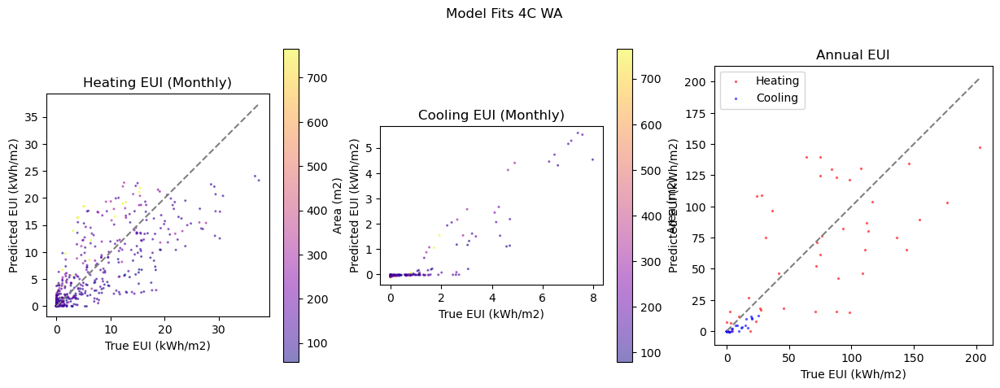

 56%|█████▌    | 25/45 [08:16<04:14, 12.70s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling   5.453003   2.197181
Heating  73.530207  84.065399
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  111.6  61.2   5.0   101.9 -61.2  0.9
Heating   62.1   9.1  44.0    79.9  -9.1  4.7

 -------------------- G5300530 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G5300530 has 7 PUMAs; lat/lon may be off
GISMATCH                                                   5311505
GEOID                                                      5311505
STATEFIP                                                        53
State                                                   Washington
PUMA                                                         11505
Name             Pierce County (North Central)--Tacoma (Port) &...
state_abbr                 

100%|██████████| 77/77 [00:09<00:00,  8.06it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
7 setpoints are crossed over.
38 setpoints are out of bounds (heating: 7, cooling:38).
38 buildings have setpoint errors.
39 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 39/1374 buildings in G5300530 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 27.30it/s]
Beginning evaluation...
Done evaluating.


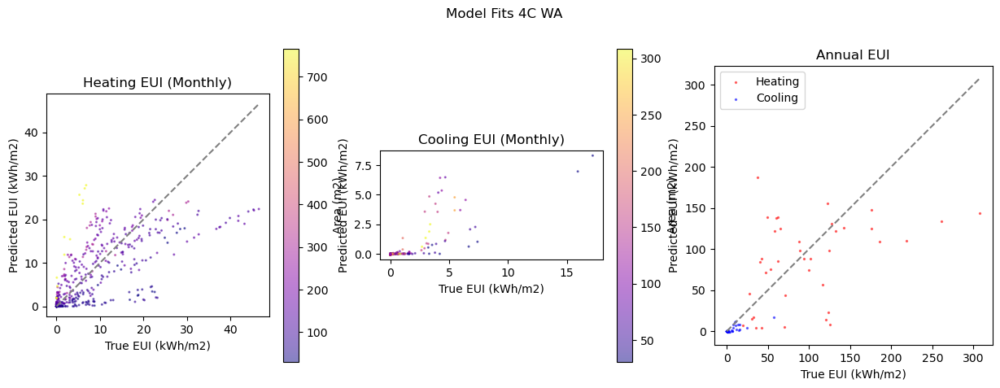

 58%|█████▊    | 26/45 [08:29<03:59, 12.62s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True        Pred
Name                          
Cooling   4.200105    1.712105
Heating  91.120649  110.721429
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  140.9  63.8   8.4   163.9 -63.8  1.3
Heating   67.1  12.5  66.1    83.9 -12.5  6.9

 -------------------- G5300610 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G5300610 has 6 PUMAs; lat/lon may be off
GISMATCH                                                   5311703
GEOID                                                      5311703
STATEFIP                                                        53
State                                                   Washington
PUMA                                                         11703
Name             Snohomish County (Central)--Everett City (Cent...
state_abbr             

100%|██████████| 77/77 [00:08<00:00,  8.65it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
5 setpoints are crossed over.
26 setpoints are out of bounds (heating: 3, cooling:24).
26 buildings have setpoint errors.
51 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 51/1223 buildings in G5300610 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 33.99it/s]
Beginning evaluation...
Done evaluating.


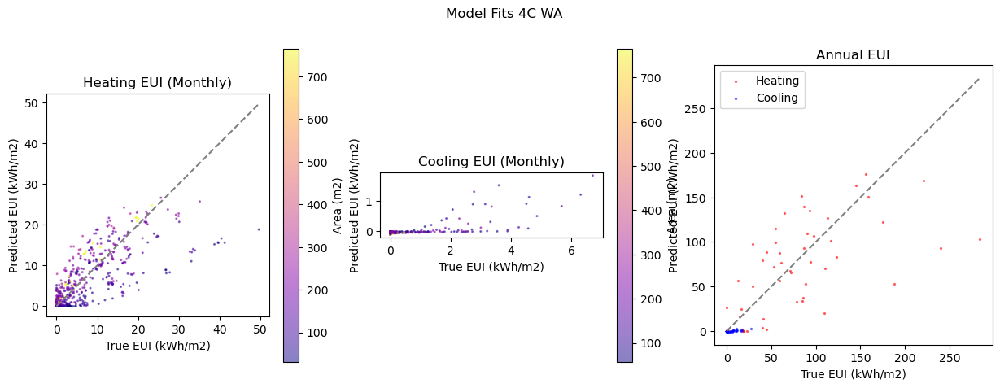

 60%|██████    | 27/45 [08:41<03:42, 12.34s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
              True       Pred
Name                         
Cooling   3.387409  -0.150822
Heating  82.210068  88.511476
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  176.0  99.0   6.7   187.5 -99.0  1.2
Heating   65.3  10.3  51.9    79.6 -10.3  5.3

 -------------------- G1700310 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1700310 has 34 PUMAs; lat/lon may be off
GISMATCH                                                   1703501
GEOID                                                      1703501
STATEFIP                                                        17
State                                                     Illinois
PUMA                                                         03501
Name             Chicago City (North)--Edgewater, Uptown & Roge...
state_abbr                

100%|██████████| 77/77 [00:09<00:00,  8.31it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
23 setpoints are crossed over.
45 setpoints are out of bounds (heating: 15, cooling:32).
46 buildings have setpoint errors.
31 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 31/8952 buildings in G1700310 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 8/8 [00:00<00:00, 24.31it/s]
Beginning evaluation...
Done evaluating.


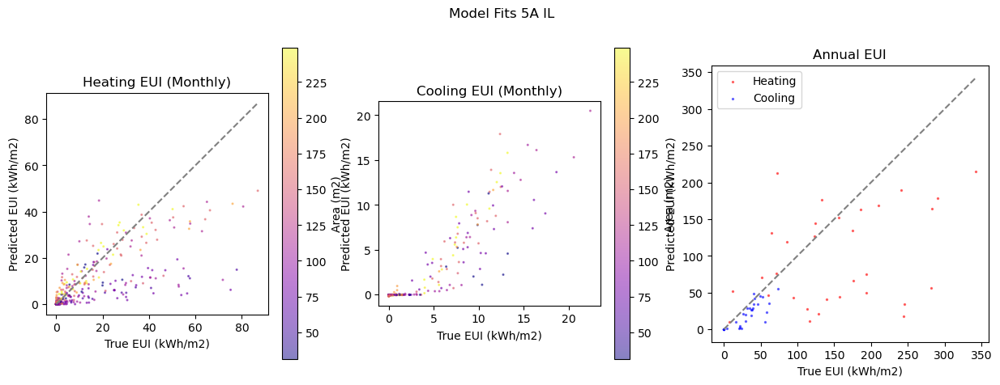

 62%|██████▏   | 28/45 [08:53<03:28, 12.25s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling   29.825416   20.828224
Heating  153.429956  112.332742
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   51.7  35.2   15.6    72.8 -35.2   2.3
Heating   66.9  36.8  103.0   103.4 -36.8  13.3

 -------------------- G2601630 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G2601630 has 13 PUMAs; lat/lon may be off
GISMATCH                                                   2603210
GEOID                                                      2603210
STATEFIP                                                        26
State                                                     Michigan
PUMA                                                         03210
Name                                 Detroit City (Northeast) PUMA
state_ab

100%|██████████| 77/77 [00:09<00:00,  8.12it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
17 setpoints are crossed over.
47 setpoints are out of bounds (heating: 14, cooling:38).
48 buildings have setpoint errors.
29 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 29/3367 buildings in G2601630 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 8/8 [00:00<00:00, 34.51it/s]
Beginning evaluation...
Done evaluating.


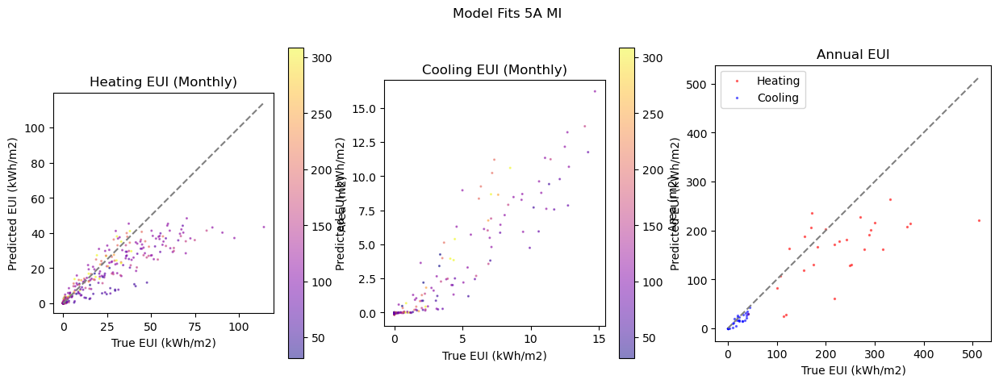

 64%|██████▍   | 29/45 [09:05<03:15, 12.21s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling   19.133025   15.736187
Heating  222.314824  166.571054
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   39.8  23.1    7.9    60.3 -23.1   1.3
Heating   44.6  29.8  100.6    66.5 -29.8  12.5

 -------------------- G2500170 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G2500170 has 16 PUMAs; lat/lon may be off
GISMATCH                                                   2500400
GEOID                                                      2500400
STATEFIP                                                        25
State                                                Massachusetts
PUMA                                                         00400
Name             Worcester & Middlesex Counties (Outside Leomin...
state_ab

100%|██████████| 77/77 [00:10<00:00,  7.35it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
19 setpoints are crossed over.
35 setpoints are out of bounds (heating: 7, cooling:32).
38 buildings have setpoint errors.
39 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 39/2551 buildings in G2500170 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 23.49it/s]
Beginning evaluation...
Done evaluating.


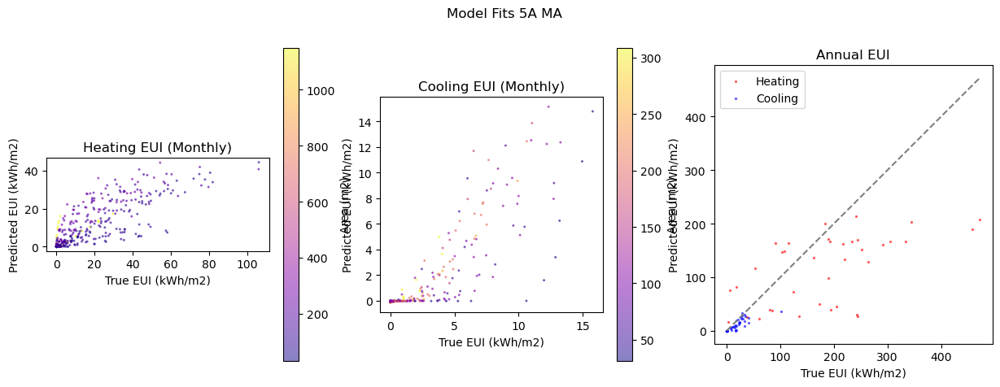

 67%|██████▋   | 30/45 [09:18<03:07, 12.53s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling   11.671105    7.447539
Heating  151.117628  116.026294
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   71.9  40.1   13.9    93.6 -40.1   1.8
Heating   63.5  37.2  111.9    87.6 -37.2  13.2

 -------------------- G4900350 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4900350 has 9 PUMAs; lat/lon may be off
GISMATCH                                                   4935002
GEOID                                                      4935002
STATEFIP                                                        49
State                                                         Utah
PUMA                                                         35002
Name             Salt Lake County (Northeast)--Salt Lake City (...
state_abb

100%|██████████| 77/77 [00:09<00:00,  7.72it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
15 setpoints are crossed over.
32 setpoints are out of bounds (heating: 9, cooling:27).
34 buildings have setpoint errors.
43 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 43/1553 buildings in G4900350 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 11/11 [00:00<00:00, 22.77it/s]
Beginning evaluation...
Done evaluating.


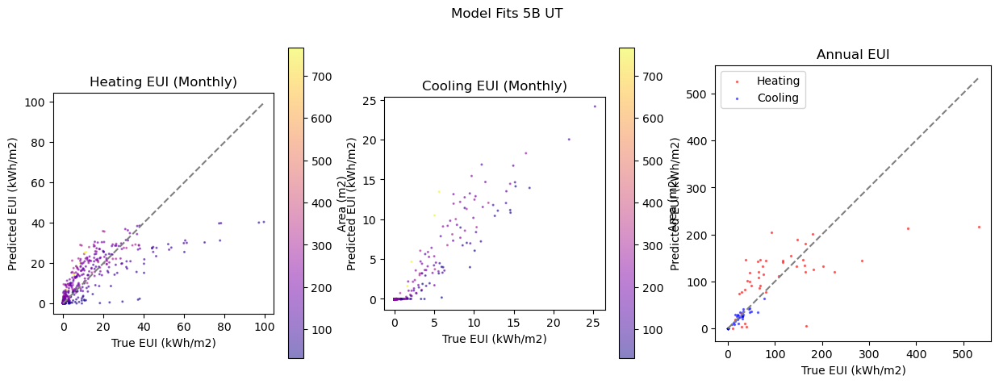

 69%|██████▉   | 31/45 [09:31<02:56, 12.63s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling   16.707080   17.769741
Heating  101.047332  123.726985
building errors
        Annual            Monthly          
        CVRMSE NMBE  RMSE  CVRMSE NMBE RMSE
Name                                       
Cooling   38.9  8.5   7.2    58.7 -8.5  1.5
Heating   71.0  0.1  80.1    94.8 -0.1  8.9

 -------------------- G0800310 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800813
GEOID                                                      0800813
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00813
Name                                  Denver City (Northwest) PUMA
state_abbr                                                      CO
division_n

100%|██████████| 77/77 [00:10<00:00,  7.41it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
11 setpoints are crossed over.
29 setpoints are out of bounds (heating: 6, cooling:28).
30 buildings have setpoint errors.
47 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 47/1229 buildings in G0800310 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 12/12 [00:00<00:00, 30.58it/s]
Beginning evaluation...
Done evaluating.


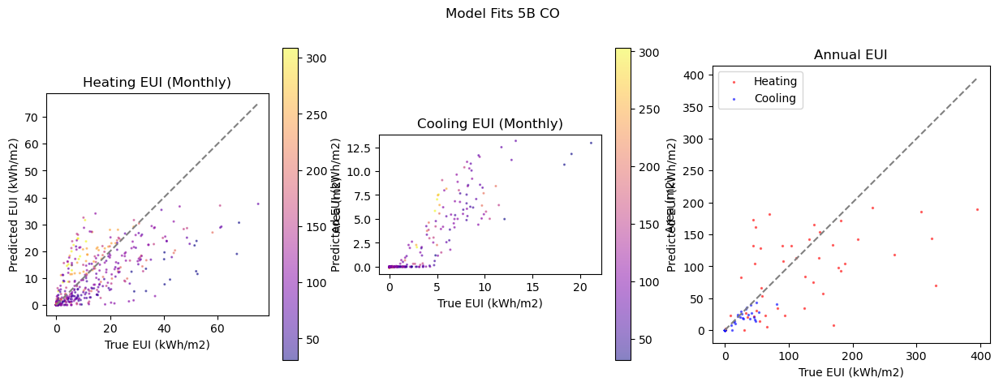

 71%|███████   | 32/45 [09:44<02:46, 12.80s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling   14.216616   10.633211
Heating  114.268603  103.376779
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   68.4  30.8  11.5    67.2 -30.8  1.8
Heating   70.7  24.2  84.7    92.1 -24.2  9.2

 -------------------- G0800410 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0800410 has 6 PUMAs; lat/lon may be off
GISMATCH                                                    804103
GEOID                                                      0804103
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         04103
Name             El Paso County (Central)--Colorado Springs Cit...
state_abbr         

100%|██████████| 77/77 [00:10<00:00,  7.61it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
11 setpoints are crossed over.
33 setpoints are out of bounds (heating: 9, cooling:27).
34 buildings have setpoint errors.
43 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 43/1096 buildings in G0800410 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 11/11 [00:00<00:00, 29.49it/s]
Beginning evaluation...
Done evaluating.


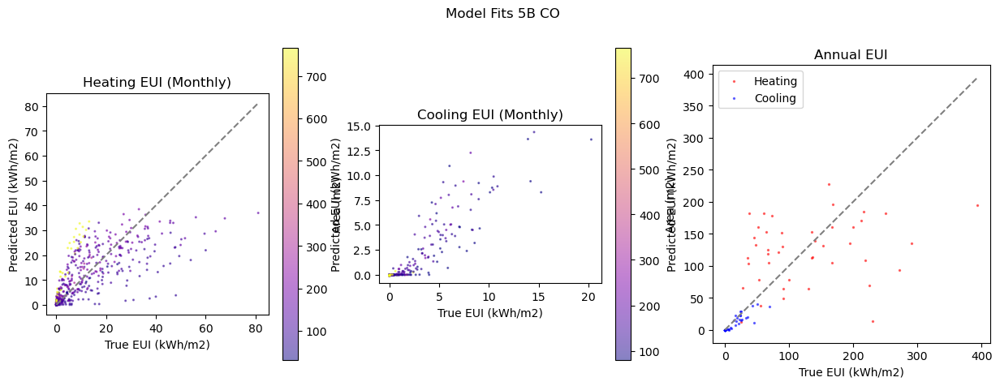

 73%|███████▎  | 33/45 [09:57<02:34, 12.85s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    9.830087    6.468499
Heating  108.264071  141.696689
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   66.8  31.7   9.2    77.0 -31.7  1.5
Heating   66.8   4.0  86.3    87.8  -4.0  9.4

 -------------------- G2700530 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G2700530 has 10 PUMAs; lat/lon may be off
GISMATCH                                                   2701405
GEOID                                                      2701405
STATEFIP                                                        27
State                                                    Minnesota
PUMA                                                         01405
Name             Hennepin County--Minneapolis (North) & St. Ant...
state_abbr        

100%|██████████| 77/77 [00:10<00:00,  7.60it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
16 setpoints are crossed over.
36 setpoints are out of bounds (heating: 5, cooling:34).
37 buildings have setpoint errors.
40 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 40/2138 buildings in G2700530 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 46.11it/s]
Beginning evaluation...
Done evaluating.


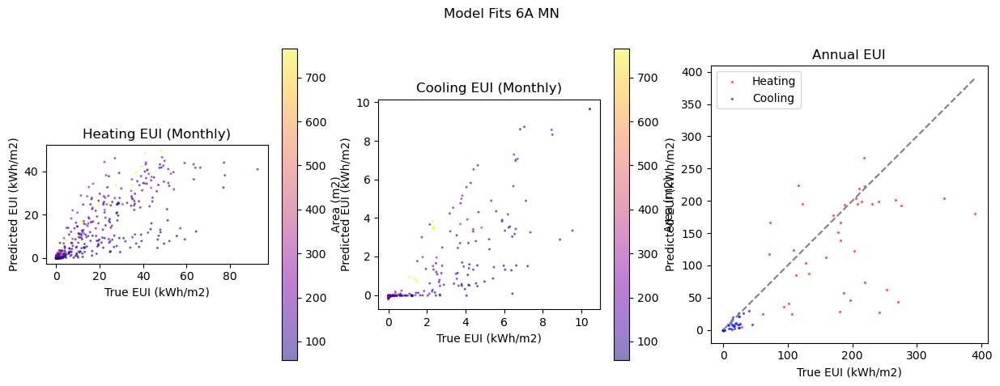

 76%|███████▌  | 34/45 [10:10<02:21, 12.87s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling   11.949354    8.490616
Heating  184.705710  165.921670
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   76.1  44.2  10.1    97.5 -44.2   1.5
Heating   53.3  27.9  94.3    75.5 -27.9  11.4

 -------------------- G5500790 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G5500790 has 8 PUMAs; lat/lon may be off
GISMATCH                                                   5541001
GEOID                                                      5541001
STATEFIP                                                        55
State                                                    Wisconsin
PUMA                                                         41001
Name                                   Milwaukee City (North) PUMA
state_abbr    

100%|██████████| 77/77 [00:10<00:00,  7.22it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
15 setpoints are crossed over.
37 setpoints are out of bounds (heating: 9, cooling:32).
37 buildings have setpoint errors.
40 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 40/1718 buildings in G5500790 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 10/10 [00:00<00:00, 23.80it/s]
Beginning evaluation...
Done evaluating.


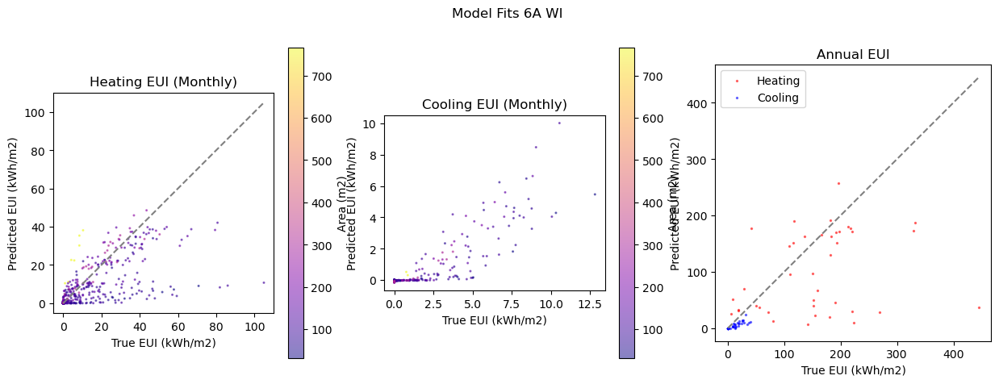

 78%|███████▊  | 35/45 [10:24<02:10, 13.10s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    9.806391    3.688591
Heating  142.524890  125.741942
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   89.4  62.0   11.2   112.4 -62.0   1.7
Heating   73.7  35.8  114.3   104.8 -35.8  13.6

 -------------------- G5500250 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   5500103
GEOID                                                      5500103
STATEFIP                                                        55
State                                                    Wisconsin
PUMA                                                         00103
Name                                       Dane County (West) PUMA
state_abbr                                               

100%|██████████| 77/77 [00:09<00:00,  7.95it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
10 setpoints are crossed over.
27 setpoints are out of bounds (heating: 2, cooling:25).
28 buildings have setpoint errors.
49 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 49/917 buildings in G5500250 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 13/13 [00:00<00:00, 26.44it/s]
Beginning evaluation...
Done evaluating.


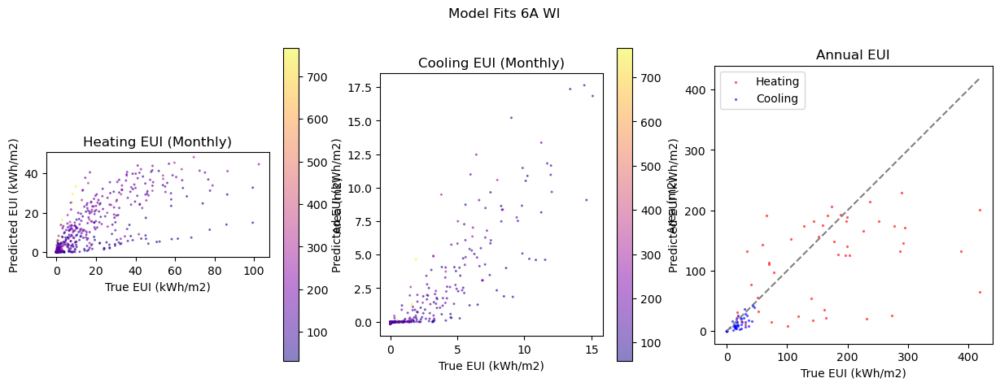

 80%|████████  | 36/45 [10:36<01:56, 12.98s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling   16.314340   12.255051
Heating  159.241725  133.683999
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   56.3  31.5    9.9    84.5 -31.5   1.6
Heating   66.5  30.5  108.1    97.3 -30.5  13.5

 -------------------- G4900050 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4905001
GEOID                                                      4905001
STATEFIP                                                        49
State                                                         Utah
PUMA                                                         05001
Name                    Cache, Summit, Morgan & Rich Counties PUMA
state_abbr                                               

100%|██████████| 77/77 [00:09<00:00,  7.82it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
11 setpoints are crossed over.
40 setpoints are out of bounds (heating: 20, cooling:28).
41 buildings have setpoint errors.
36 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 36/162 buildings in G4900050 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 9/9 [00:00<00:00, 21.07it/s]
Beginning evaluation...
Done evaluating.


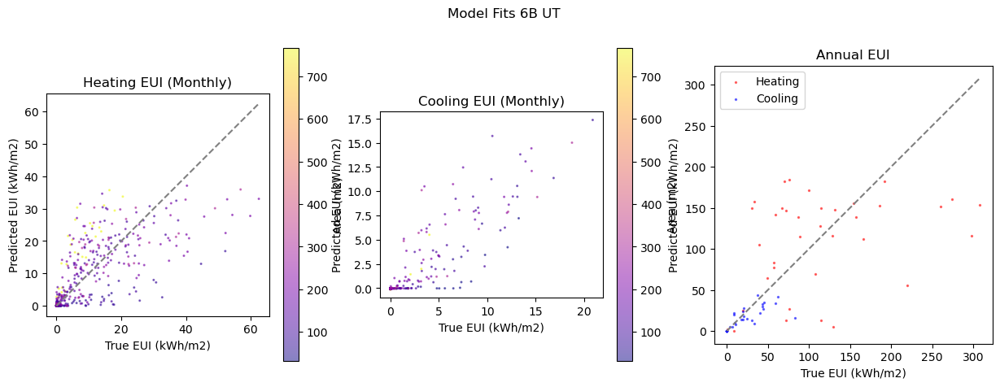

 82%|████████▏ | 37/45 [10:49<01:43, 12.89s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True       Pred
Name                          
Cooling   14.195585   11.25925
Heating  111.828635  134.76400
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   77.7  29.8  15.0    85.6 -29.8  2.2
Heating   70.5   4.3  80.7    90.6  -4.3  8.6

 -------------------- G0800370 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800400
GEOID                                                      0800400
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00400
Name                  Eagle, Summit, Grand & Jackson Counties PUMA
state_abbr                                                      CO
divi

100%|██████████| 77/77 [00:09<00:00,  8.50it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
3 setpoints are crossed over.
57 setpoints are out of bounds (heating: 40, cooling:33).
57 buildings have setpoint errors.
20 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 20/129 buildings in G0800370 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 19.42it/s]
Beginning evaluation...
Done evaluating.


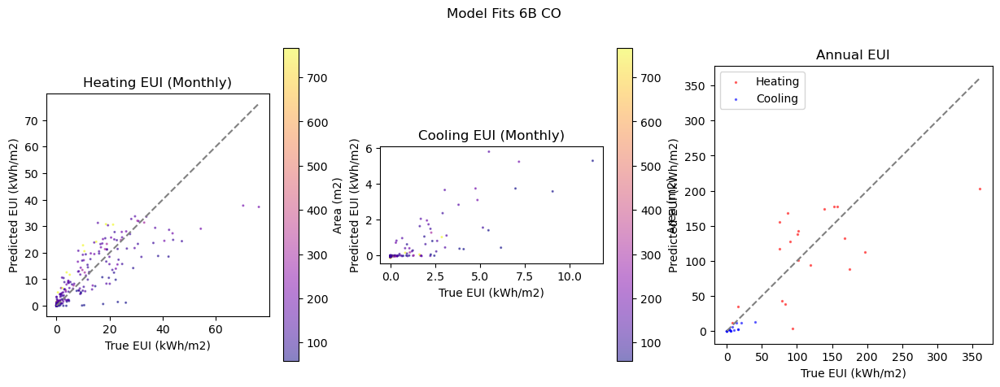

 84%|████████▍ | 38/45 [11:01<01:28, 12.60s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    6.307918    2.317283
Heating  118.248337  131.926211
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  109.1  61.6   8.3   128.8 -61.6  1.3
Heating   51.3   5.8  61.0    71.8  -5.8  7.1

 -------------------- G4900430 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4905001
GEOID                                                      4905001
STATEFIP                                                        49
State                                                         Utah
PUMA                                                         05001
Name                    Cache, Summit, Morgan & Rich Counties PUMA
state_abbr                                                      UT


100%|██████████| 77/77 [00:10<00:00,  7.63it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
8 setpoints are crossed over.
45 setpoints are out of bounds (heating: 22, cooling:34).
45 buildings have setpoint errors.
32 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 32/112 buildings in G4900430 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 8/8 [00:00<00:00, 23.24it/s]
Beginning evaluation...
Done evaluating.


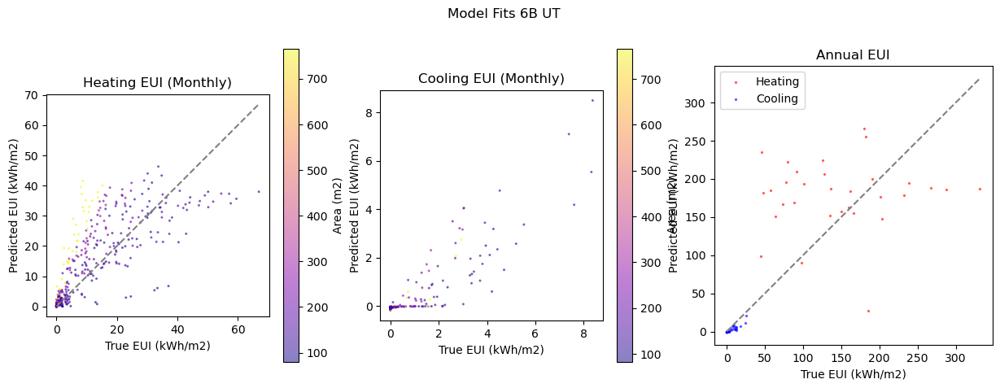

 87%|████████▋ | 39/45 [11:14<01:15, 12.67s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    5.113503    2.539185
Heating  109.729141  185.193917
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   80.4  51.7   5.1   102.2 -51.7  0.9
Heating   63.1 -22.1  89.3    80.5  22.1  9.5

 -------------------- G2701370 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2700500
GEOID                                                      2700500
STATEFIP                                                        27
State                                                    Minnesota
PUMA                                                         00500
Name             St. Louis County (Southeast)--Duluth, Hermanto...
state_abbr                                                      MN


100%|██████████| 77/77 [00:11<00:00,  6.47it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
10 setpoints are crossed over.
60 setpoints are out of bounds (heating: 19, cooling:52).
61 buildings have setpoint errors.
16 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 16/425 buildings in G2701370 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 40.36it/s]
Beginning evaluation...
Done evaluating.


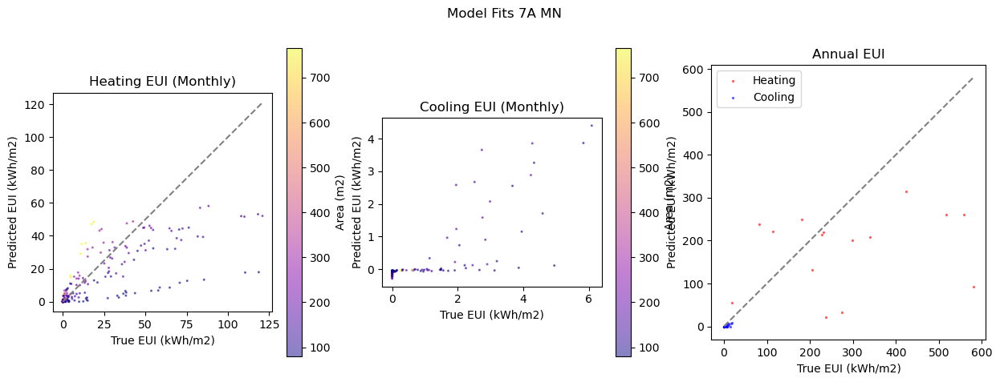

 89%|████████▉ | 40/45 [11:28<01:05, 13.10s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    4.956681    1.170639
Heating  218.194458  203.943533
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   95.2  72.3    6.9   131.1 -72.3   1.1
Heating   71.3  36.6  191.1    96.9 -36.6  21.6

 -------------------- G2700350 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2700700
GEOID                                                      2700700
STATEFIP                                                        27
State                                                    Minnesota
PUMA                                                         00700
Name              Crow Wing, Morrison, Todd & Wadena Counties PUMA
state_abbr                                               

100%|██████████| 77/77 [00:09<00:00,  7.79it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
13 setpoints are crossed over.
56 setpoints are out of bounds (heating: 23, cooling:48).
56 buildings have setpoint errors.
21 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 21/169 buildings in G2700350 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 6/6 [00:00<00:00, 15.84it/s]
Beginning evaluation...
Done evaluating.


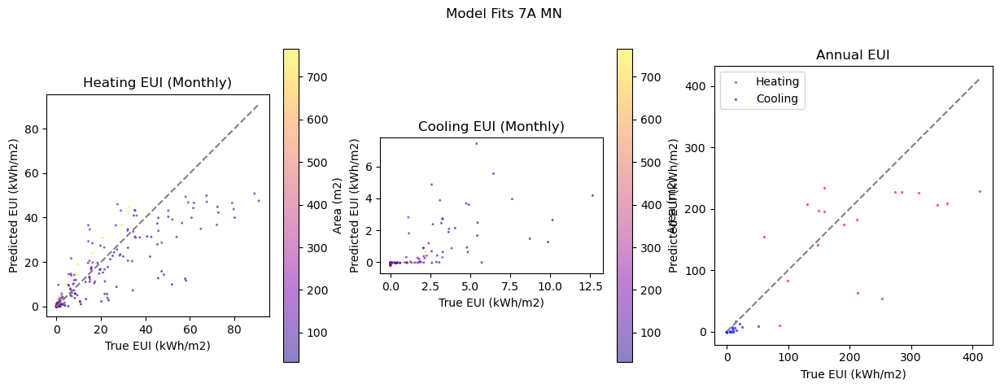

 91%|█████████ | 41/45 [11:41<00:51, 12.99s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    5.928416    1.832965
Heating  147.611919  141.770132
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling  120.3  65.0  11.3   141.4 -65.0   1.8
Heating   50.7  21.4  92.8    74.6 -21.4  11.4

 -------------------- G2300030 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2300100
GEOID                                                      2300100
STATEFIP                                                        23
State                                                        Maine
PUMA                                                         00100
Name             Northeast Maine--Aroostook & Washington Counti...
state_abbr                                                    

100%|██████████| 77/77 [00:09<00:00,  7.96it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
13 setpoints are crossed over.
57 setpoints are out of bounds (heating: 25, cooling:48).
58 buildings have setpoint errors.
19 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 19/163 buildings in G2300030 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 20.19it/s]
Beginning evaluation...
Done evaluating.


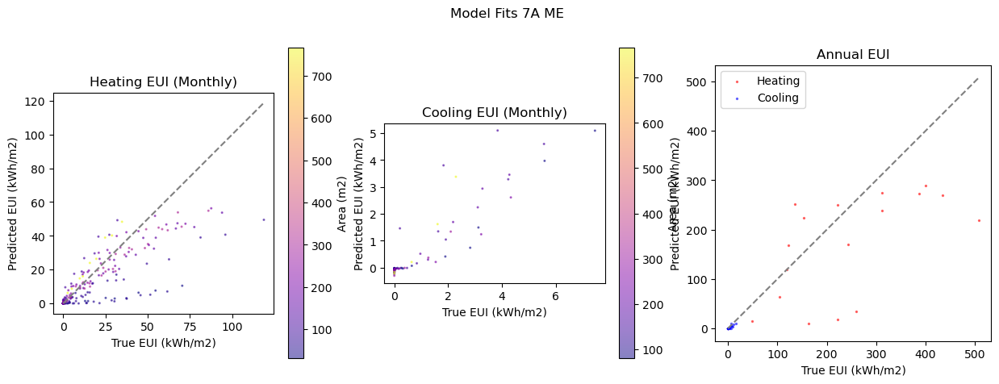

 93%|█████████▎| 42/45 [11:53<00:38, 12.86s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    4.150593    2.744502
Heating  219.634891  191.327381
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   73.1  37.8    2.9    95.5 -37.8   0.6
Heating   56.5  30.4  123.2    79.5 -30.4  14.5

 -------------------- G0801170 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800400
GEOID                                                      0800400
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00400
Name                  Eagle, Summit, Grand & Jackson Counties PUMA
state_abbr                                               

100%|██████████| 77/77 [00:08<00:00,  8.76it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
5 setpoints are crossed over.
59 setpoints are out of bounds (heating: 43, cooling:47).
59 buildings have setpoint errors.
18 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 18/125 buildings in G0801170 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 16.51it/s]
Beginning evaluation...
Done evaluating.


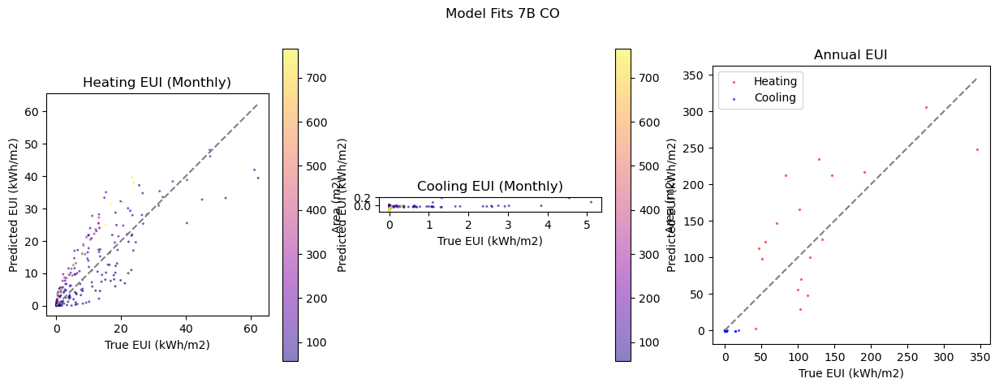

 96%|█████████▌| 43/45 [12:05<00:24, 12.45s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    1.542819   -0.432261
Heating  120.239678  173.523209
building errors
        Annual              Monthly            
        CVRMSE   NMBE  RMSE  CVRMSE   NMBE RMSE
Name                                           
Cooling  212.9  109.9   6.8   232.9 -109.9  1.0
Heating   53.9  -13.5  66.0    67.7   13.5  6.9

 -------------------- G0801070 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800200
GEOID                                                      0800200
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00200
Name             Northwest Colorado--Garfield, Routt, Moffat & ...
state_abbr                                               

100%|██████████| 68/68 [00:08<00:00,  7.86it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
13 setpoints are crossed over.
53 setpoints are out of bounds (heating: 14, cooling:44).
53 buildings have setpoint errors.
15 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 15/68 buildings in G0801070 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 18.45it/s]
Beginning evaluation...
Done evaluating.


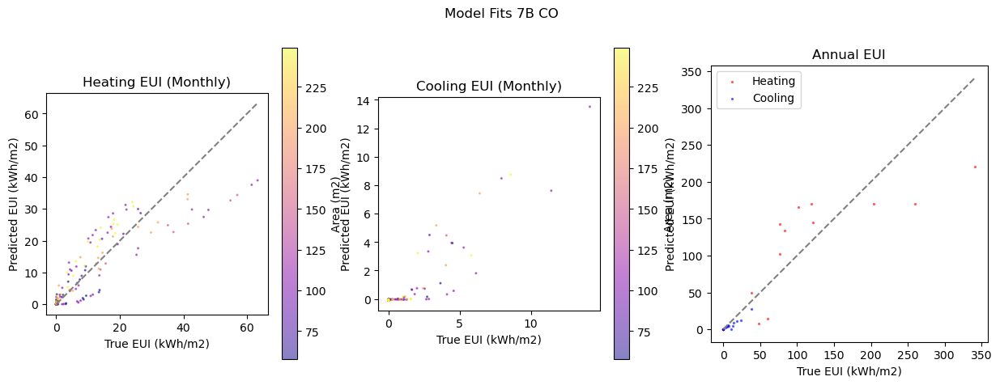

 98%|█████████▊| 44/45 [12:16<00:12, 12.14s/it]c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of

annual urban euis
               True        Pred
Name                           
Cooling    9.498110    5.837255
Heating  104.484922  107.509566
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   60.1  41.2   5.9    95.1 -41.2  1.1
Heating   52.0   2.3  53.1    71.4  -2.3  6.1

 -------------------- G0800490 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800400
GEOID                                                      0800400
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00400
Name                  Eagle, Summit, Grand & Jackson Counties PUMA
state_abbr                                                      CO


100%|██████████| 67/67 [00:07<00:00,  8.71it/s]


Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
5 setpoints are crossed over.
57 setpoints are out of bounds (heating: 44, cooling:40).
57 buildings have setpoint errors.
10 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 10/67 buildings in G0800490 county.


Done preparing weather


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 11.85it/s]
Beginning evaluation...
Done evaluating.


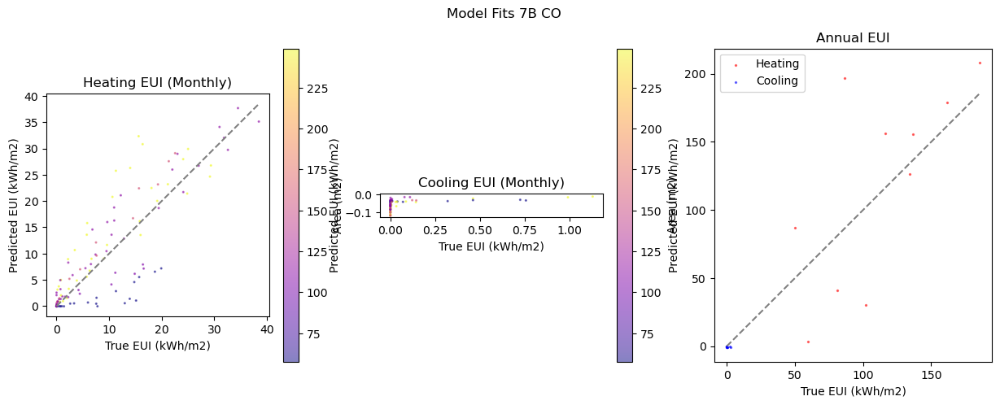

100%|██████████| 45/45 [12:26<00:00, 16.60s/it]

annual urban euis
               True        Pred
Name                           
Cooling    0.634576   -0.493857
Heating  116.210565  139.038086
building errors
        Annual              Monthly            
        CVRMSE   NMBE  RMSE  CVRMSE   NMBE RMSE
Name                                           
Cooling  269.7  174.2   1.6   313.4 -174.2  0.3
Heating   46.0   -6.2  51.2    59.2    6.2  5.5


In [27]:
max_buildings = None  # set to None to run all in county
use_pred_caching = True
apply_cops = True
nrel_bucket = "oedi-data-lake"
county_resource_dir = Path("c:/users/szvsw/downloads/county_resources")
dummy_epw_path = county_resource_dir / "G0500070_base_epw.epw"
res_schedule_path = Path("c:/users/szvsw/downloads/res_schedule.npy")
county_id = "G0500070"
# model config
registry = "ml-for-building-energy-modeling/model-registry"
model = "Global UBEM Shoebox Surrogate with Combined TS Embedder"
tag = "v3"
resource = "model.ckpt"

error_dfs = []
preds_dfs = []
ubem_dfs = []
for county_id in tqdm(run_counties):
    print("\n", "-" * 20, county_id, "-" * 20)
    # county_id = county_list[0]
    # county_id = counties_by_cz["6A"][0]

    surr_cache_key = f"{registry}/{model}/{tag}/{resource}"
    if surr_cache_key in surrogate_cache:
        print("Loading surrogate model from cache...")
        surrogate, trainer = surrogate_cache[surr_cache_key]
    else:
        print("Loading surrogate model from registry...")
        surrogate = Surrogate.load_from_registry(registry, model, tag, resource)
        surrogate.model.eval()
        torch.set_float32_matmul_precision("medium")
        trainer = Trainer(
            accelerator="auto",
            devices="auto",
            strategy="auto",
            enable_progress_bar=True,
        )
        surrogate_cache[surr_cache_key] = (surrogate, trainer)
    print("Surrogate model loaded.")

    print("Loading Data For County")
    county_data = tract_df[
        ["nhgis_puma_gisjoin", "weather_file_2018", "weather_file_TMY3"]
    ].loc[county_id]
    # assert county_data.nhgis_puma_gisjoin.nunique() < 5
    if isinstance(county_data.nhgis_puma_gisjoin, pd.Series):
        if county_data.nhgis_puma_gisjoin.nunique() > 5:
            print(
                f"County {county_id} has {county_data.nhgis_puma_gisjoin.nunique()} PUMAs; lat/lon may be off"
            )
        puma_join = county_data.nhgis_puma_gisjoin.values[0]
    else:
        puma_join = county_data.nhgis_puma_gisjoin

    row = gdf.set_index("GISJOIN").loc[puma_join]
    lon, lat = row.geometry.centroid.x, row.geometry.centroid.y
    print(row)
    county_features = rs_df.xs(county_id, level="county")
    print("done loading data for county.")

    occ_sched = np.load(res_schedule_path)[-1]
    s3_nrel = boto3.client("s3", config=Config(signature_version=UNSIGNED))
    county_resource_dir.mkdir(exist_ok=True, parents=True)
    if max_buildings is None:
        max_buildings = len(county_features)
    max_buildings = min(max_buildings, len(county_features))

    features = county_features.iloc[:max_buildings]
    features = features.reset_index()
    # features = features[features.floors == 4]
    assert "building_id" in features.columns

    """
    ####################
    PULL BUILDING DATA
    ####################
    """
    results_files = features.results
    assert results_files.nunique() == len(features)

    with tempfile.TemporaryDirectory() as tempdir:
        cache_key = hash(f"{features.to_json()}")
        if cache_key in parquet_cache:
            df_out = parquet_cache[cache_key]
        else:
            dl_parquet = partial(
                download_and_open_parquet,
                s3_client=s3_nrel,
                bucket=nrel_bucket,
            )
            with ThreadPoolExecutor(max_workers=10) as executor:
                df_out = pd.concat(
                    list(
                        tqdm(
                            executor.map(dl_parquet, results_files),
                            total=len(results_files),
                        )
                    ),
                    keys=features.building_id,
                )
            parquet_cache[cache_key] = df_out

    """
    ####################
    EPD/LPD HANDLING
    ####################
    """
    print("Preparing EPD/LPD features...")
    elec_kWh = df_out[elec_cols].sum(axis=1).unstack(level="building_id")
    lighting_kWh = df_out[light_cols].sum(axis=1).unstack(level="building_id")
    footprint_area = features.area.values
    n_floors = features.floors.values
    area = footprint_area  # * n_floors
    elec_W = elec_kWh * 1000
    lighting_W = lighting_kWh * 1000
    peak_elec = elec_W.max()
    peak_lighting = lighting_W.max()
    peak_elec = peak_elec.replace(0, 1)  # prevent divide by zero errors
    peak_lighting = peak_lighting.replace(0, 1)
    elec_W = elec_W.T
    lighting_W = lighting_W.T
    epd = peak_elec / area
    lpd = peak_lighting / area
    elec_frac = elec_W / peak_elec.values.reshape(-1, 1)
    lighting_frac = lighting_W / peak_lighting.values.reshape(-1, 1)
    if len(elec_frac) == 0:
        continue
    schedules = np.stack(
        [
            elec_frac.values,
            lighting_frac.values,
            occ_sched.reshape(1, 8760).repeat(len(features), axis=0),
        ],
        axis=1,
    )
    # matches the schedule stacking, each a unique schedule
    features["template_idx"] = range(len(features))
    assert (features.building_id == epd.index).all()
    assert (features.building_id == lpd.index).all()

    print("Done preparing EPD/LPD features.")

    """
    ####################
    FEATURE SETTING
    ####################
    """
    print("Preparing shoebox features...")
    for i in range(12):
        features[f"shading_{i}"] = 0

    features["EquipmentPowerDensity"] = epd.values
    features["LightingPowerDensity"] = lpd.values
    features["LightingPowerDensity"] = lpd.values
    features["RecoverySettings"] = 0
    features["SlabRValue"] = 0.35
    features["RoofRValue"] = features["RoofRValue"] / 2
    features["FacadeRValue"] = features["FacadeRValue"] / 2
    features["perim_depth"] = 5
    features["core_depth"] = 10
    features["ground_2_footprint"] = 1.0
    features["roof_2_footprint"] = 1.0
    # features["RoofRValue"] = features["RoofRValue"] / 3

    # setpoint handling
    setpoints = features[["HeatingSetpoint", "CoolingSetpoint"]].values
    new_sp = np.ones_like(setpoints) * setpoints
    sp_crossover_violation = setpoints[:, 0] > setpoints[:, 1]
    new_sp[sp_crossover_violation, 0] = setpoints[sp_crossover_violation, 1] - 0.01
    assert (new_sp[:, 0] <= new_sp[:, 1]).all()
    # features["HeatingSetpoint"] = new_sp[:, 0]
    # features["CoolingSetpoint"] = new_sp[:, 1]
    print(f"{sp_crossover_violation.sum()} setpoints are crossed over.")
    hsp_conf = surrogate.space_config["HeatingSetpoint"]
    csp_conf = surrogate.space_config["CoolingSetpoint"]
    hsp_oob = (features["HeatingSetpoint"] > hsp_conf["max"]) | (
        features["HeatingSetpoint"] < hsp_conf["min"]
    )
    csp_oob = (features["CoolingSetpoint"] > csp_conf["max"]) | (
        features["CoolingSetpoint"] < csp_conf["min"]
    )
    sp_oob = hsp_oob | csp_oob
    print(
        f"{sp_oob.sum()} setpoints are out of bounds (heating: {hsp_oob.sum()}, cooling:{csp_oob.sum()})."
    )
    sp_error_mask = sp_crossover_violation | sp_oob
    print(f"{sp_error_mask.sum()} buildings have setpoint errors.")
    features = features[~sp_error_mask]
    df_out = df_out[
        df_out.index.get_level_values("building_id").isin(features.building_id)
    ]

    print(f"{len(features)} buildings remain after setpoint errors.")

    #################### Infiltration Handling
    original_infil_min = features.Infiltration.min()
    original_infil_max = features.Infiltration.max()
    infil_range = original_infil_max - original_infil_min
    infil_range = np.where(np.abs(infil_range - 0) > 1e-6, infil_range, 1)
    original_infil_scalar = (
        features.Infiltration.values.reshape(-1, 1) - original_infil_min
    ) / (infil_range.reshape(-1, 1)) * 2 - 1
    winter_infil = 0.000075
    summer_infil = 0.001
    winter_infil_var_percent = 0.5
    summer_infil_var_percent = 0.2
    # winter_infil = 0.0001
    # summer_infil = 0.001
    # winter_infil_var_percent = 0.0
    # summer_infil_var_percent = 0.0
    features["WinterInfiltration"] = (
        winter_infil + winter_infil * winter_infil_var_percent * original_infil_scalar
    )
    features["SummerInfiltration"] = (
        summer_infil + summer_infil * summer_infil_var_percent * original_infil_scalar
    )

    ##### Finalizing

    features["weight"] = 0.25
    features = features.set_index("building_id")
    bldg_ids = features.index.values

    ############## Shoebox Generation
    # 8 sb per building because 4 orientations and 2 seasons with different infiltration rates
    bldg_ids_for_sb = np.repeat(bldg_ids, 8)
    is_summer = np.tile(np.array([False, True]), len(bldg_ids)).repeat(4)
    sb_features = features.loc[bldg_ids_for_sb]
    sb_features["is_summer"] = is_summer
    sb_features["sb_orientation_ix"] = np.tile(np.tile(np.arange(4), len(bldg_ids)), 2)
    sb_features["orientation"] = (
        sb_features.sb_orientation_ix / 4 * 2 * np.pi + sb_features.orientation
    ) % (2 * np.pi)
    # sb_features.loc[~sb_features.is_summer, "Infiltration"] = winter_infil
    # sb_features.loc[sb_features.is_summer, "Infiltration"] = summer_infil
    sb_features.loc[~sb_features.is_summer, "Infiltration"] = sb_features.loc[
        ~sb_features.is_summer, "WinterInfiltration"
    ]
    sb_features.loc[sb_features.is_summer, "Infiltration"] = sb_features.loc[
        sb_features.is_summer, "SummerInfiltration"
    ]

    sb_features = sb_features.reset_index()
    sb_features.loc[sb_features.is_summer, "building_id"] = -sb_features.loc[
        sb_features.is_summer, "building_id"
    ]

    print("Done preparing shoebox features.")

    """
    ####################
    WEATHER
    ####################
    """
    print("Preparing weather...")
    if len(features) == 0:
        continue
    epw_files = features.epw.unique()
    assert len(epw_files) == 1
    epw_file = epw_files[0]
    print(
        f"Will process {len(features)}/{len(county_features)} buildings in {county_id} county."
    )
    # TODO: we can manually construct climate directly from climate_csv
    # if we can compute the lat/lon directly from the county code.
    #  once we have lat lon we can also compute solar positions identically to as in 'extract'
    # Instead, we have to open the original location based epw, and then overwrite with data from the downloaded csv
    epw = EPW(dummy_epw_path)
    epw.location.latitude = lat
    epw.location.longitude = lon
    climate = extract(epw, surrogate.weather_transform.channel_names)
    epw_csv_data = download_and_open_epw_csv(
        s3_client=s3_nrel,
        bucket=nrel_bucket,
        local_output_path=county_resource_dir,
        key=epw_file,
    )
    for key, val in channel_map.items():
        if val is None:
            continue
        if isinstance(val, str):
            climate[surrogate.weather_transform.channel_names.index(key)] = (
                epw_csv_data[val].values
            )
        elif callable(val):
            climate[surrogate.weather_transform.channel_names.index(key)] = val(
                epw_csv_data
            )

    print("Done preparing weather")

    """
    ####################
    PREDICTIONS
    ####################
    """
    cache_key = hash(f"{(sb_features.to_json(), schedules, climate)}")
    if not use_pred_caching:
        print("Clearing prediction cache.")
        preds_cache = {}
    if cache_key in preds_cache and use_pred_caching:
        sb_preds, monthly_preds, annual_preds = preds_cache[cache_key]
    else:
        sb_preds, monthly_preds, annual_preds = predict_ubem(
            trainer=trainer,
            surrogate=surrogate,
            features=sb_features,
            schedules=schedules,
            climate=climate,
            apply_cops=apply_cops,
            batch_size=32,
        )
        monthly_preds["Cooling"] = monthly_preds.loc[
            -monthly_preds.index, "Cooling"
        ].values
        monthly_preds = monthly_preds.loc[monthly_preds.index > 0]
        annual_preds["Cooling"] = annual_preds.loc[
            -annual_preds.index, "Cooling"
        ].values
        annual_preds = annual_preds.loc[annual_preds.index > 0]
        no_thermal = df_out[res_thermal_output_cols].groupby("building_id").sum() < 0.1
        no_heating = no_thermal["out.load.heating.energy_delivered.kbtu"]
        no_cooling = no_thermal["out.load.cooling.energy_delivered.kbtu"]
        monthly_preds.loc[:, ("Heating", slice(None))] = monthly_preds.loc[
            :, ("Heating", slice(None))
        ] * (~no_heating).values.reshape(-1, 1)
        monthly_preds.loc[:, ("Cooling", slice(None))] = monthly_preds.loc[
            :, ("Cooling", slice(None))
        ] * (~no_cooling).values.reshape(-1, 1)
        annual_preds.loc[:, "Heating"] = annual_preds["Heating"] * (~no_heating)
        annual_preds.loc[:, "Cooling"] = annual_preds["Cooling"] * (~no_cooling)

        preds_cache[cache_key] = (
            sb_preds,
            monthly_preds,
            annual_preds,
        )

    """
    ####################
    EVALUATION
    ####################
    """
    print("Beginning evaluation...")
    area = features.area.values.reshape(-1, 1)
    kWh_per_kBtu = 1 / 3.412
    y_true = df_out[
        [
            "out.load.heating.energy_delivered.kbtu",
            "out.load.cooling.energy_delivered.kbtu",
        ]
    ]
    y_true.columns = ["Heating", "Cooling"]
    monthly_preds = monthly_preds[y_true.columns]

    y_true = y_true.unstack(level="building_id")
    y_true = y_true.resample("1M").sum()
    y_true = (
        y_true.stack(level="building_id").unstack(level="timestamp")
        * kWh_per_kBtu
        / area
    )
    y_true.columns = monthly_preds.columns
    if apply_cops:
        y_true["Cooling"] = y_true["Cooling"] / features.cop_cooling.values.reshape(
            -1, 1
        )
        y_true["Heating"] = y_true["Heating"] / features.cop_heating.values.reshape(
            -1, 1
        )

    annual_eui_true = y_true.T.groupby("Name").sum().T
    annual_gross_true = annual_eui_true * area
    annual_gross_preds = annual_preds * area
    annual_urban_gross_true = annual_gross_true.sum()
    annual_urban_gross_preds = annual_gross_preds.sum()
    annual_urban_eui_true = annual_urban_gross_true / area.sum()
    annual_urban_eui_preds = annual_urban_gross_preds / area.sum()
    annual_urban_eui = pd.concat(
        [annual_urban_eui_true, annual_urban_eui_preds], axis=1, keys=["True", "Pred"]
    )

    rmse_annual = (annual_eui_true - annual_preds).pow(2).mean().pow(0.5)
    cvrmse_annual = rmse_annual / annual_eui_true.mean()
    nmbe_annual = (annual_eui_true - annual_preds).mean() / annual_eui_true.mean()
    rmse_monthly = (
        (monthly_preds - y_true).pow(2).mean().groupby("Name").mean().pow(0.5)
    )
    cvrmse_monthly = rmse_monthly / y_true.mean().groupby("Name").mean()
    nmbe_monthly = (monthly_preds - y_true).mean().groupby(
        "Name"
    ).mean() / y_true.mean().groupby("Name").mean()
    rmse = pd.concat(
        [rmse_annual, rmse_monthly], axis=1, keys=["Annual", "Monthly"]
    ).round(1)
    cvrmse = (
        pd.concat([cvrmse_annual, cvrmse_monthly], axis=1, keys=["Annual", "Monthly"])
        * 100
    ).round(1)
    nmbe = (
        pd.concat([nmbe_annual, nmbe_monthly], axis=1, keys=["Annual", "Monthly"]) * 100
    ).round(1)
    errors = (
        pd.concat([rmse, cvrmse, nmbe], axis=1, keys=["RMSE", "CVRMSE", "NMBE"])
        .swaplevel(axis=1)
        .sort_index(axis=1)
    )
    errors
    print("Done evaluating.")
    """
    ####################
    PLOTTING
    ####################
    """
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    plt.suptitle(f"Model Fits {features.iloc[0].climate_zone} {features.iloc[0].state}")
    for i, target in enumerate(["Heating", "Cooling"]):
        y_true_col = y_true[target].values.flatten()
        y_pred_col = monthly_preds[target].values.flatten()
        sc = ax[i].scatter(
            y_true_col,
            y_pred_col,
            s=1.5,
            alpha=0.5,
            # color="blue" if target == "Cooling" else "red",
            c=county_features.loc[monthly_preds.index].area.values.repeat(12),
            cmap="plasma",
            label=target,
        )
        ax[i].plot(
            [0, y_true_col.max()],
            [0, y_true_col.max()],
            color="gray",
            linestyle="--",
        )
        fig.colorbar(sc, ax=ax[i], label="Area (m2)")
        ax[i].set_xlabel("True EUI (kWh/m2)")
        ax[i].set_ylabel("Predicted EUI (kWh/m2)")
        ax[i].set_title(f"{target} EUI (Monthly)")
        ax[i].set_aspect("equal", adjustable="box")

        ax[2].scatter(
            annual_eui_true[target],
            annual_preds[target],
            color="blue" if target == "Cooling" else "red",
            label=target,
            s=2,
            alpha=0.5,
        )
    ax[2].set_title("Annual EUI")
    ax[2].set_xlabel("True EUI (kWh/m2)")
    ax[2].set_ylabel("Predicted EUI (kWh/m2)")
    ax[2].plot(
        [0, annual_eui_true.max().max()],
        [0, annual_eui_true.max().max()],
        color="gray",
        linestyle="--",
    )
    ax[2].set_aspect("equal", adjustable="box")
    ax[2].legend()
    plt.show()

    fig.tight_layout()

    print("annual urban euis")
    print(annual_urban_eui)
    print("building errors")
    print(errors)

    """
    ####################
    SAVE RESULTS
    ####################
    """
    X = features.reset_index()
    df = pd.concat(
        [monthly_preds, y_true], axis=1, keys=["Predicted", "True"], names=["Segment"]
    )
    assert (df.index.values == X.building_id.values).all()
    df.index = pd.MultiIndex.from_frame(X)
    fp = f"resstock_validation_{county_id}_worse_envelope.hdf"
    df.to_hdf(fp, mode="w", key="preds_and_true")
    errors.to_hdf(fp, mode="a", key="errors")
    annual_urban_eui.to_hdf(fp, mode="a", key="urban_eui")
    preds_dfs.append(df)
    error_dfs.append(errors)
    ubem_dfs.append(annual_urban_eui)

In [29]:
load_from_disk = False
matcher = "resstock_validation_*_worse_envelope.hdf"
if load_from_disk:
    preds_dfs = []
    ubem_dfs = []
    error_dfs = []
    for file in Path(".").glob(matcher):
        error_dfs.append(pd.read_hdf(file, key="errors"))
        ubem_dfs.append(pd.read_hdf(file, key="urban_eui"))
        preds_dfs.append(pd.read_hdf(file, key="preds_and_true"))

all_errors = pd.concat(error_dfs, axis=0, keys=run_counties, names=["county"])
all_urbans = pd.concat(ubem_dfs, axis=0, keys=run_counties, names=["county"])
all_preds = pd.concat(preds_dfs, axis=0, keys=run_counties, names=["county"])
all_preds.columns.names = ["segment", "end_use", "month"]
all_areas = all_preds.index.get_level_values("area")
total_monthly_energy = all_preds * all_areas.values.reshape(-1, 1)

In [31]:
len(all_areas)

3187

In [56]:
# TODO: predict total energy usage for the counties by buildings; see how well we predict each county.
data = all_preds
# data = total_monthly_energy
res = (all_preds["Predicted"] - all_preds["True"]).T.groupby("end_use").sum().T
squared_error = res.pow(2)
mse_by_zone_and_end_use = squared_error.groupby("climate_zone").mean().sort_index()
true_mean_by_zone_and_end_use = (
    all_preds["True"]
    .T.groupby("end_use")
    .sum()
    .T.groupby("climate_zone")
    .mean()
    .sort_index()
)
cvrmse_by_zone_and_end_use = (
    mse_by_zone_and_end_use.pow(0.5) / true_mean_by_zone_and_end_use
).sort_index()
cvrmse_by_zone_and_end_use * 100

end_use,Cooling,Heating
climate_zone,,
1A,34.873579,225.831789
2A,31.338600,92.211165
2B,29.825138,98.329921
3A,32.658954,70.777319
3B,107.485443,119.716794
3C,176.512149,75.562375
4A,48.300880,79.939554
4B,57.291712,59.729674
4C,145.204474,65.884152


In [30]:
total_monthly_energy.sum().groupby(["segment", "end_use"]).sum()

segment    end_use
Predicted  Cooling    2.973973e+07
           Heating    2.407471e+07
True       Cooling    2.830205e+07
           Heating    2.317165e+07
dtype: float64

Text(0, 0.5, 'Predicted EUI (kWh/m2)')

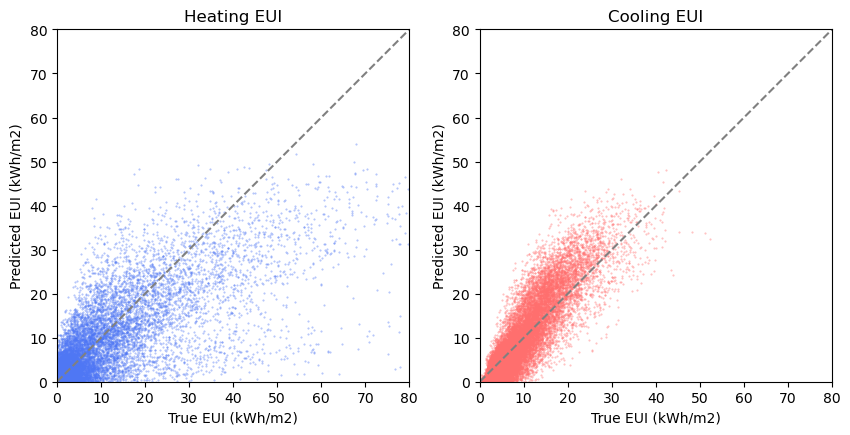

In [32]:
stacked = all_preds.stack(level=["month"])
c = pd.Series(stacked.index.get_level_values("climate_zone")).apply(
    lambda x: czs.index(x)
)
scale_y = 0.5
psize = 0.2
a = 0.5

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].scatter(
    stacked["True"].Heating,
    stacked["Predicted"].Heating,
    s=psize,
    alpha=a,
    color="#4f77f4",
)
ax[0].set_aspect("equal", adjustable="box")
max_y = max(stacked["True"].Heating.max() * scale_y, 80)
ax[0].plot(
    [0, max_y],
    [0, max_y],
    linestyle="--",
    color="gray",
)
ax[0].set_ylim(0, max_y)
ax[0].set_xlim(0, max_y)
ax[0].set_title("Heating EUI")
ax[0].set_xlabel("True EUI (kWh/m2)")
ax[0].set_ylabel("Predicted EUI (kWh/m2)")

ax[1].scatter(
    stacked["True"].Cooling,
    stacked["Predicted"].Cooling,
    s=psize,
    alpha=a,
    color="#ff6f6e",
)
ax[1].set_aspect("equal", adjustable="box")
scale_y = 0.5
max_y = max(stacked["True"].Cooling.max() * scale_y, 80)
ax[1].plot(
    [0, max_y],
    [0, max_y],
    linestyle="--",
    color="gray",
)
ax[1].set_ylim(0, max_y)
ax[1].set_xlim(0, max_y)
ax[1].set_title("Cooling EUI")
ax[1].set_xlabel("True EUI (kWh/m2)")
ax[1].set_ylabel("Predicted EUI (kWh/m2)")